# Visión por Computador - Práctica 3 - Extracción (y Emparejamiento) de Características y Registrado de Imágenes

#### 11 puntos   |   Fecha de entrega: 31 de Diciembre, 23:59   |   Forma de entrega: a través de la tarea creada en https://pradogrado2425.ugr.es/

### Estudiante: <mark>Guillermo Ramblado Carrasco</mark>



<font color='blue'>En esta práctica aprenderás:

<font color='blue'>a) A detectar puntos de interés utilizando el detector de esquinas de Harris (Ejercicio 1).

<font color='blue'>b) A encontrar correspondencias entre los _keypoints_ (puntos de interés) de dos imágenes utilizando distintos descriptores (Ejercicio 2).

<font color='blue'>c) A componer un mosaico/panorama a partir de un conjunto de imágenes utilizando homografías (Ejercicio 3).

In [111]:
# Let's start importing all background modules
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
import sys,os
# change directory
%cd '/content/drive/My Drive'
# Let's import the python module exercises.py  to have access to its functions and Classes
get_image = lambda route: os.path.join('/content/drive/MyDrive/images/', route)
import numpy as np
from matplotlib import pyplot as plt
import cv2

Mounted at /content/drive
/content/drive/My Drive


In [112]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [113]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [114]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()

In [115]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

In [116]:
def GaussFunc(x,sigma):
    return np.exp( -x**2 /(2*(sigma**2)) )

def GaussDeriv1Func(x,sigma):
    return (-x/(sigma**2))*GaussFunc(x,sigma)

def GaussDeriv2Func(x,sigma):
    return (x**2/(sigma**4) - 1/(sigma**2))*GaussFunc(x,sigma)

def gaussianMask1D(sigma=0, sizeMask=0, order=0, flag=False):
    # order = 0 -> función Gaussiana
    # order = 1 -> derivada de la Gaussiana
    # order = 2 -> derivada segunda de la Gaussiana

    #me deben de dar o sigma o el tamaño de mascara
    if sigma<=0 and sizeMask<=0:
      raise ValueError("Recuerde proporcionar el sigma o el tamaño de mascara")

    if sigma>0:
      #procedo a calcular el valor de k, que determinará a su vez el tamaño de kernel
      k=np.ceil(3*sigma)
      sizeMask=2*k+1
    else:
      #me dan el tamaño de máscara, necesito determinar el sigma
      #compruebo que el tamaño de kernel aportado sea un entero impar
      if((sizeMask+1)%2!=0):
        raise ValueError("Recuerde que el tamaño de mascara debe ser un entero impar")
      #tam_kernel = 2*k+1 --> k = (tam_kernel-1)/2
      k=(sizeMask-1)/2
      #min(k)>=3*sigma --> sigma=k/3
      sigma=round(k/3,2)

    #a partir de aquí, ya tengo fijado tanto mi sigma como el tamaño del kernel
    #defino el conjunto discreto donde evaluaré mi función gaussiana (de orden el indicado por parámetro)
    x=np.arange(-k,k+1)

    if(order==0):
      mascara=GaussFunc(x,sigma)
      #normalizo la mascara resultante
      mascara/= np.sum(mascara)
    elif(order==1):
      mascara=GaussDeriv1Func(x,sigma)
      mascara=mascara*sigma
    elif(order==2):
      mascara=GaussDeriv2Func(x,sigma)
      mascara=mascara*(sigma**2)
    else:
      raise ValueError("El valor de 'order' debe ser 0,1 o 2")

    if flag:
      return sizeMask,sigma,x,mascara
    else:
      return mascara

In [117]:
def my2DConv(im, sigma, orders):
  if orders==[0,0]: # Suavizado Gaussiano
    return cv2.sepFilter2D(im,-1,gaussianMask1D(sigma),gaussianMask1D(sigma))
  elif orders==[1,0]: #Primera derivada gaussiana en 'x'
    return cv2.sepFilter2D(im,ddepth=cv2.CV_64F,kernelX=gaussianMask1D(sigma=sigma,order=1),kernelY=gaussianMask1D(sigma=sigma,order=0))
  elif orders==[0,1]: #Primera derivada gaussiana en 'y'
    return cv2.sepFilter2D(im,ddepth=cv2.CV_64F,kernelX=gaussianMask1D(sigma=sigma,order=0),kernelY=gaussianMask1D(sigma=sigma,order=1))
  elif orders==[2,0]: #Segunda derivada gaussiana horizontal ('x')
    return cv2.sepFilter2D(im,ddepth=cv2.CV_64F,kernelX=gaussianMask1D(sigma=sigma,order=2),kernelY=gaussianMask1D(sigma=sigma,order=0))
  elif orders==[0,2]: #Segunda derivada gaussiana vertical ('y')
    return cv2.sepFilter2D(im,ddepth=cv2.CV_64F,kernelX=gaussianMask1D(sigma=sigma,order=0),kernelY=gaussianMask1D(sigma=sigma,order=2))
  else:
    print('error in order of derivative')

# <font color='blue'>**Ejercicio 1:** Harris Corner Detector (3 puntos)

<font color='blue'>Implementar la detección de los 450-500 puntos Harris más fuertes en una imagen (es decir, como mínimo, se deben detectar/mostrar 450 puntos de interés y como máximo 500). Los pasos para implementar el detector de esquinas de Harris son los siguientes: \

> <font color='blue'>a) Fijar las escalas de diferenciación ($\sigma_D$) e integración ($\sigma_I$) en 1.5 y 2.25, respectivamente (aunque también se pueden emplear otros valores de sigma si el estudiante considera que mejoran el rendimiento; esto habría que justificarlo adecuadamente).

> <font color='blue'>b) Calcular las derivadas de la imagen. Para ello, se valorará positivamente el emplear las funciones creadas por el propio alumnado (en lugar de emplear directamente _cv2.getDerivKernels()_, _cv2.GaussianBlur()_, _cv2.filter2D()_ y similares).

> <font color='blue'>c) Calcular los tres términos de la _Second Moment Matrix_ ($SMM$) en cada píxel. Para ello, aplicar convolución con una máscara gaussiana con $\sigma_I$.

> <font color='blue'>d) A partir de la $SMM$, calcular el valor de Harris en cada píxel de la imagen.

> <font color='blue'>e) Aplique la supresión de no máximos mediante la función `corner_peaks()` (https://scikit-image.org/docs/stable/api/skimage.feature.html#skimage.feature.corner_peaks) del módulo `skimage.features`. El estudiante debe seleccionar una `min_distance` adecuada (`The minimal allowed distance separating peaks`) y un umbral de respuesta adecuado en el mapa de Harris para mantener solo la cantidad de _keypoints_ que se solicitan en el enunciado. El resultado será una lista de coordenadas $(x,y)$. Extraiga los valores en estas coordenadas y cree una lista de vectores $(x,y,value)$.

> <font color='blue'>f) Calcule la orientación principal para cada punto. Esto se hace suavizando ambas imágenes derivadas con un sigma suficientemente grande ($\sigma=3$) y, a continuación, calculando la orientación del gradiente en esos puntos.

> <font color='blue'>g) Cree una lista de _keypoints_ usando los puntos seleccionados. Un _keypoint_ suele representarse como un vector que incluye distintos elementos, por ejemplo, $(x,y,scale,orientation)$. En nuestro caso, un _keypoint_ es una estructura de OpenCV (`cv2.KeyPoint`), asociada a cada región detectada, que contendrá las coordenadas $x$ e $y$ del _keypoint_, así como su tamaño ($size$, es decir, el diámetro con el que se va a mostrar) y su orientacion ($angle$, calculada en el paso anterior). El parámetro $size$ de _KeyPoint()_, es decir, el diámetro del _keypoint_ mostrado, debe ser suficientemente grande como para ser visualizado adecuadamente. Una posibilidad es emplear `size=4*np.floor(3*sigmaI)+1`

> <font color='blue'>h) Dibuje los puntos sobre la imagen de entrada usando la función `drawKeyPoints()` (https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920), y los _flags_ `cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG+cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

<font color='blue'>Se deben calcular los puntos de Harris sobre la imagen `IMG_20220312_102944_S.jpg`, y se debe mostrar:
* <font color='blue'>El mapa de respuestas de Harris (valor de Harris) en cada píxel de la imagen,
* <font color='blue'>el mapa de Harris umbralizado, es decir, una vez aplicado supresión de no máximos y un umbral mínimo de respuesta adecuado para obtener el número de puntos de interés solicitados,
* <font color='blue'>y la imagen de entrada con los keypoints finales, junto con el número exacto de _keypoints_ detectados (es decir, es necesario hacer un `print()` con el número de puntos de Harris).





# Esquinas como puntos de interés

El detector de Harris es un **detector de esquinas**, que busca justamente seleccionar como puntos de interés de la imagen las esquinas. Además, identifican zonas únicas de la imagen, e invariantes a traslaciones, rotaciones e iluminaciones.



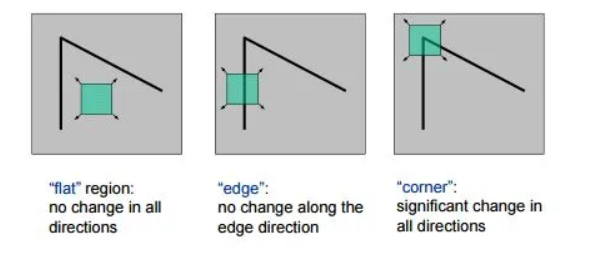

La fotografía previa muestra diferentes regiones (cuadrado azul) que podríamos considerar a la hora de caracterizar dicha imagen. Tal y como se vio en teoría, una esquina es la región más interesante que podríamos considerar, ya que veríamos cambios del gradiente en ambas direcciones, a diferencia de lo que ocurre en el 1º y 2ª caso de la imagen.

# Funcionamiento del Detector de Harris

El procedimiento que aplicará el detector de Harris es el siguiente:

  1. Desplazamos una pequeña ventana sobre cada uno de los píxeles de la imagen, evaluando en dicha ventana la siguiente función:

  $$ E(u,v) = \sum_{x,y} w(x,y) [I(x+u,y+v)-I(x,y)]^2$$
  donde

  * $(u,v)$ indica la dirección de desplazamiento
  * $ (x,y)$ referencia las posiciones de los píxeles de la ventana
  * $w(x,y)$ es la función empleada para ponderar los gradientes de los diferentes píxeles dentro de la ventana. En nuestro caso, se empleará la función gaussiana.

2. Se procede a optimizar la función $E(u,v)$, función objetivo, seleccionando aquellos píxeles para los que la ventana haya entregado una mayor respuesta. Esos píxeles serán los que se identificarán como esquinas.

La función objetivo se puede simplificar de la siguiente forma:

$$E(u,v) \approx \begin{bmatrix}u & v \end{bmatrix} M \begin{bmatrix}
u \\
v
\end{bmatrix}$$

donde $M = \sum_{x,y} w(x,y)\begin{bmatrix}
I_xI_x & I_xI_y \\
I_xI_y & I_yI_y
\end{bmatrix}$

Tras calcular dicha matriz para cada píxel de la imagen, y trabajando sobre la ventana centrada en el píxel, se define la siguiente puntuación, denominado **valor de Harris**:

$$f_H = \frac{Det(M)}{Traza(M)}$$

Finalmente, se procede a seleccionar aquellos píxeles con valor de Harris alto, lo que se suele hacer empleando un umbral.

# Non Maximal Suppression

Tras todo el procedimiento anterior comentado, se seleccionarán todos aquellos píxeles cercanos a una esquina. Para hacer frente a esto, simplemente consideramos el píxel de mayor respuesta (mayor valor Harris), descartando el resto, todo esto localmente.

# Implementación de las funciones necesarias para emplear el detector de Harris

Comenzamos asignando los valores de los siguientes parámetros:

* $σ_D$ : suavizado gaussiano empleado para calcular las derivadas horizontal y vertical
* $σ_I\$ : función gaussiana empleada para ponderar los gradientes de los píxeles de la ventana



In [118]:
sigmaD=1.5
sigmaI=2.25

A continuación, se definirán las siguientes funciones:

- `derivatives` : cálculo de las derivadas horizontal y vertical

- `HarrisMap` : cálculo de la matriz de Harris, la cual almacena el valor de Harris de los diferentes píxeles de la imagen de partida

In [119]:
#Calculamos las derivadas horizontal y vertical usando la derivada de la gaussiana
def derivatives(im,sigmaD):
  dx=my2DConv(im, sigmaD, [1,0]) #derivada horizontal
  dy=my2DConv(im, sigmaD, [0,1])#derivada vertical
  return dx,dy

# Compute Harris-criterium Map
def HarrisMap(dx,dy,sigmaI):
  #Se emplea la gaussiana a la hora de ponderar los diferentes píxeles de la ventana
  #Comenzamos calculando las entradas de la matriz M
  Ix=my2DConv(dx**2, sigmaI, [0,0])
  Iy=my2DConv(dy**2, sigmaI, [0,0])
  Ixy=my2DConv(dx*dy, sigmaI, [0,0])
  #Procedemos a calcular el determinante y la traza
  det = Ix*Iy - Ixy**2
  traza = Ix + Iy
  #Calculamos el valor de Harris del píxel sobre el que centramos la ventana
  HMap = det/traza

  return HMap

Una vez implementado el cálculo de la matriz de Harris, definimos la función `NonMaximalSuppression`, encargada de aplicar el umbral especificado, seguido de NonMaximalSuppression. Para ello, emplearemos el método `corner_peaks`, que requiere los siguientes parámetros:

* `image` : mapa de Harris
* `min_distance` : la mínima distancia que debe de haber entre picos. Este parámetro es el que permite aplicar NonMaximalSuppression, desplazando una ventana de un determinado tamaño por el mapa de respuestas umbralizado, comprobando si el píxel situado en el centro de la ventana es el de máxima respuesta en comparación al resto de píxeles que caen dentro de dicha ventana (equivalente a ir tomando el pico de mayor respuesta localmente).
* `threshold_abs` : respuesta mínima de un píxel para que sea considerado como esquina.

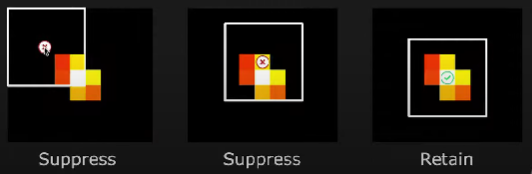

In [120]:
def NonMaximaSuppression(harrisMap, min_distance, threshold):
  #Partiendo del mapa de Harris (score asociado a cada píxel de la imagen original), seleccionamos aquellos píxeles con un score por encima del umbral definido
  #Además, aplicamos supresión de no máximos para quedarnos con un píxel del grupo de píxeles próximos a una esquina, en este caso, aquel que genera la máxima respuesta
  esquinas = corner_peaks(harrisMap, min_distance, threshold_abs = threshold)
  #Tomamos los valores de Harris de los píxeles identificados como esquinas
  valores_harris = harrisMap[esquinas[:,0],esquinas[:,1]]

  return esquinas, valores_harris

A continuación, procedemos a calcular la orientación del gradiente de cada píxel de la imagen (`orientation`), seguido del método `keyPoints`, encargado de generar la lista de keypoints, que almacenan posición, diámetro del entorno y orientación del gradiente de los diferentes píxeles finalmente seleccionados como esquinas.

In [121]:
# compute the orientation map
def orientation(dx,dy):
  #Calculamos la orientación (en grados) de los puntos detectados
  #Comenzamos suavizando las imágenes derivadas
  smooth_dx = my2DConv(dx, 3.0, [0,0])
  smooth_dy = my2DConv(dy, 3.0, [0,0])
  theta = np.arctan(smooth_dy,smooth_dx) * (180/np.pi)
  return theta

# Create the KeyPoint list from the lists of locations, orientations and scales
def keyPoints(coord,theta,size):
  keyPoints=[]
  #Recorremos la lista de puntos detectados como esquinas (puntos de interés de la imagen)
  for i in range(len(coord)):
    x,y = coord[i]
    #tomamos el ángulo asociado
    angulo = theta[x,y]
    #generamos el keypoint
    keypoint = cv2.KeyPoint(float(y),float(x),float(size), angulo)
    keyPoints.append(keypoint)
  return(keyPoints)


Una vez implementados los métodos correspondientes, estamos preparados para probar el funcionamiento del detector de Harris.

Comencemos probando que la matriz de Harris se genera correctamente para la imagen especificada, asignando tonos más intensos a aquellos píxeles con un valor de Harris más alto.

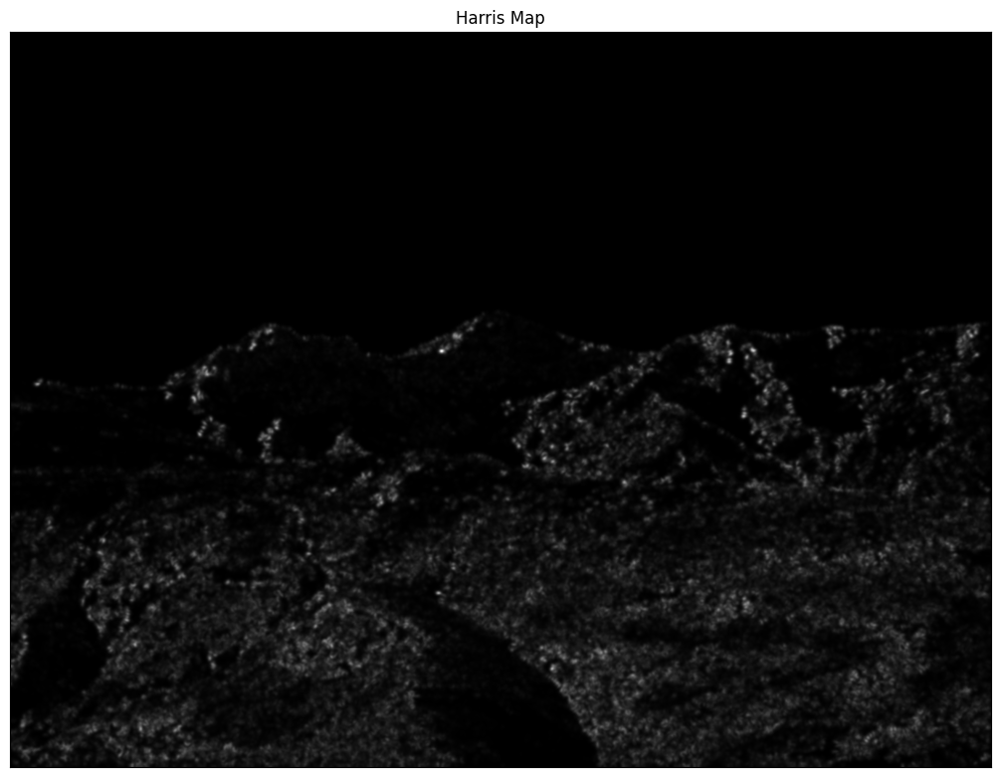

In [122]:
from skimage.feature import corner_peaks
img=readIm(get_image('IMG_20220312_102944_S.jpg'),1)
#Necesitamos trabajar con la imagen en escala de grises
im = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

#Comenzamos asignando los valores de suavizado
sigmaD = 1.5
sigmaI = 2.25
#Calculamos las derivadas de la imagen
dx, dy = derivatives(im, sigmaD)
#Calculamos el mapa de Harris (score de cada píxel de la imagen)
harrisMap = HarrisMap(dx,dy,sigmaI)
#Calculamos el mapa de orientaciones
theta = orientation(dx,dy)

displayIm(harrisMap,'Harris Map', 2)

Tal y como se puede apreciar, se marcarán con tonos más intensos aquellos píxeles en cuyo entorno se produzca una mayor variación de los gradientes, en ambas direcciones, y que serán candidatos a ser posibles esquinas.

Ahora visualizaremos el mapa de Harris una vez aplicado el umbral y NonMaximalSuppression.

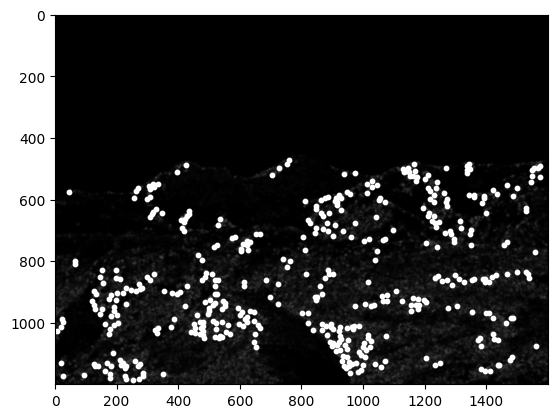

In [123]:
min_distance = 5
threshold = 1500
esquinas, valores_harris = NonMaximaSuppression(harrisMap, min_distance, threshold)
#definos una matriz de ceros, asignando valores no nulos únicamente a los píxeles finalmente seleccionados y que se identificarán como esquinas
harris_filtered = np.zeros_like(harrisMap)
harris_filtered[esquinas[:,0],esquinas[:,1]] = harrisMap[esquinas[:, 0], esquinas[:, 1]]

#Partiendo del mapa de Harris inicial, marcamos con la mayor intensidad posible los píxeles finalmente identificados como esquinas
plt.imshow(harrisMap, cmap='gray')  # Muestra la imagen base en escala de grises
plt.scatter(esquinas[:, 1], esquinas[:, 0], color='white', s=10)  # Marca las esquinas en blanco
plt.show()

Finalmente, procedemos a visualizar las esquinas o keypoints finalmente seleccionados sobre la imagen original a color.

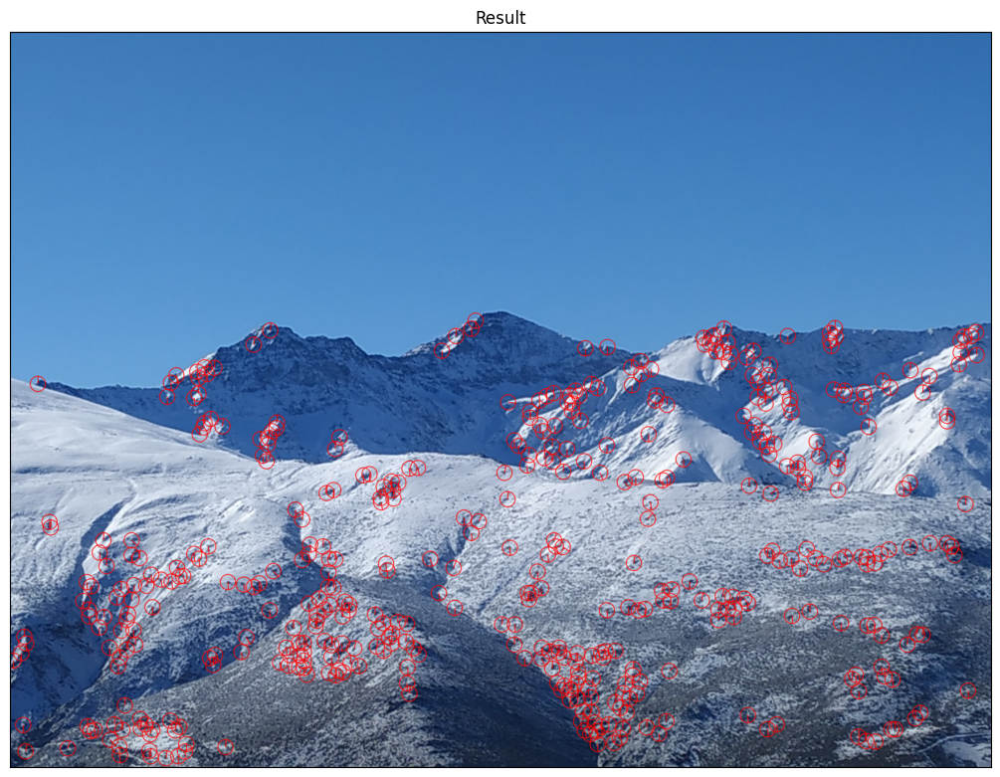

In [124]:
#Generamos los keypoints pasando las coordenadas de las esquinas detectadas, matriz de orientaciones y diámetro del keypoint
size=4*np.floor(3*sigmaI)+1
puntos_interes = keyPoints(esquinas, theta, size)
#Procedemos a dibujar los puntos de interés sobre la imagen original, para su visualización
img_with_keypoints = img.copy()
cv2.drawKeypoints(img, puntos_interes, img_with_keypoints, color=(255,0,0), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG+cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
displayIm(img_with_keypoints)

# <font color='blue'>**Ejercicio 2:** Emparejamiento de _keypoints_ entre imágenes usando descriptores SIFT, HOG y LBP (3 puntos)

<font color='blue'>En este apartado, partiendo de un detector de características (SIFT) y tres descriptores de características (SIFT, HOG y LBP), vamos a calcular el emparejamiento entre _keypoints_ de dos imágenes. Las imágenes con las que se trabajará en este ejercicio serán `IMG_20220312_102940_S.jpg` y `IMG_20220312_102944_S.jpg`. Estas imágenes son de $1200\times1600$ pero, tras leerlas, se debe reducir su tamaño a la mitad ($600\times800$). Es en esta última dimensionalidad en la que realizaremos todo el ejercicio y visualizaremos las imágenes. Y, a continuación, debemos pasarlas a escala de grises. Nota importante: del mismo modo que se calculan _keypoints_ y descriptores en escala de grises, luego los matches/emparejamientos sí se visualizan sobre las imágenes originales en color.

## <font color='blue'>SIFT (Scale-invariant feature transform)

<font color='blue'>En un primer momento, el alumnado debe aplicar el algoritmo SIFT a ambas imágenes para extraer los puntos de interés (_keypoints_) y los descriptores (https://docs.opencv.org/3.4/dc/dc3/tutorial_py_matcher.html). Luego, vamos a emplear tres criterios de emparejamiento: _brute force_ (`cv2.BFMatcher`), _brute force with cross-check_ (`cv2.BFMatcher` con `crossCheck=True`) y el _Lowe's ratio test_ (`knnMatch`) para calcular los emparejamientos y mostrar los 100 mejores matches utilizando la función `cv2.drawMatches`.

<font color='blue'>En los siguientes apartados, emplearemos exactamente los mismos _keypoints_ detectados por SIFT para calcular otros descriptores en dichas localizaciones y comparar los resultados obtenidos. En los próximos apartados también se utilizarán y compararán los mismos tres criterios de emparejamiento indicados (_BF_, _BF+CC_ y _Lowe's ratio test_).

SIFT permite la detección y descripción de keypoints, empleando un **vector de 128 elementos** por cada keypoint, denominado **descriptor SIFT**.

**Detección de keypoint**

Para detectar keypoints, se emplea una pila de máscaras gaussianas de distintos sigmas, lo que nos permite construir una pila de diferencias gaussianas (restando máscaras gaussianas consecutivas), convolucionando la imagen con las diferencias gaussianas, y considerando los píxeles de máxima respuesta, con diámetro el $σ$ que define la anchura de la máscara gaussiana que nos entregó dicho máximo. Las imágenes siguientes muestran el proceso descrito:

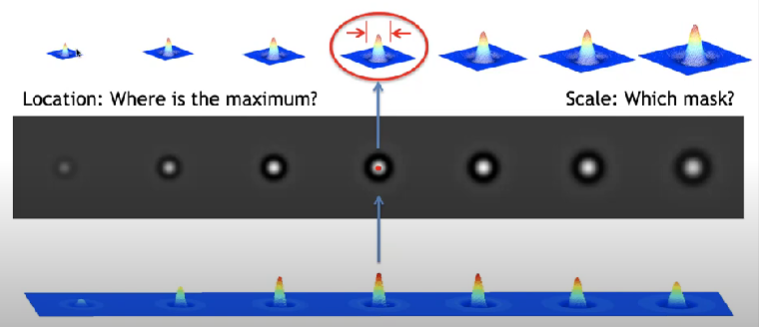

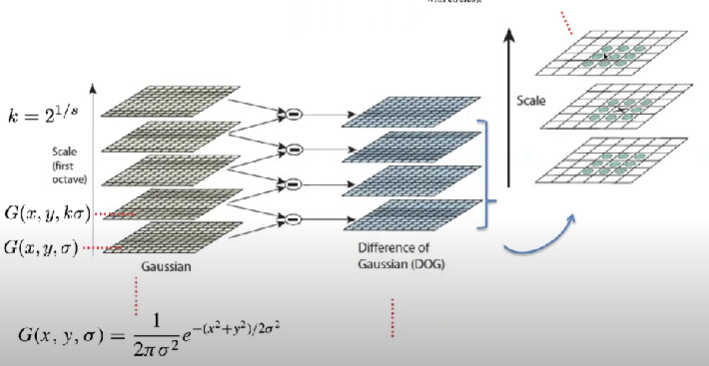

La imagen previa muestra cómo se estructura el proceso en octavas:
- Se separa el espacio-escala en octavas, tal que cada octava representa la imagen en una escala distinta, normalmente reduciendo a la mitad el tamaño de la imagen cuando pasamos de una octava a la siguiente. El nº de octavas depende del tamaño de la imagen original. Además, se aplican las mismas diferencias gaussianas, independientemente de la octava en la que nos situemos.

- El factor de incremento del $σ$ a la hora de suavizar será $k=2^{\frac{1}{s}}$, siendo $s$ el nº de niveles por octava, es decir, nº de diferencias gaussianas a aplicar por octava. Si usamos $n$ niveles en cada octava, con un sigma inicial $σ_{0}$, se emplearán $n+1$ máscaras gaussianas de sigmas $σ_{0}$, $ \left( 2^{\frac{1}{n}} \right) \times σ_{0} $, $ \left( 2^{\frac{1}{n}} \right)^2 \times σ_{0} $ ... $ \left( 2^{\frac{1}{n}} \right)^n \times σ_{0} $ , respectivamente.

- Un píxel de la imagen se compara con sus ocho vecinos, con los 9 píxeles vecinos en el nivel de escala superior, y con los 9 del nivel de escala inferior, tal y como muestra la imagen, lo que equivale a trabajar con las diferencias gaussianas adyacentes. Si es un extremo local, es un potencial keypoint.

Una vez obtenidos los keypoints iniciales, descartamos aquellos que pertenezcan a un borde o que no tengan asociado un contraste lo suficientemente alto, ya que ambos no nos servirán como características.
- Empleamos un umbral para eliminar aquellos keypoints inicialmente detectados que tengan asociada una intensidad por debajo del umbral establecido.
- Para eliminar aquellos píxeles pertenecientes a un borde, usamos una técnica similar a la empleada por Harris Coner Detector, y que implica usar una matriz Hessiana 2x2 (segundas derivadas). Sabemos que los bordes tienen asociados un autovalor mucho más grande que el otro, por lo que teniendo en cuenta esto, realizamos el prooceso reflejado en la siguiente imagen:


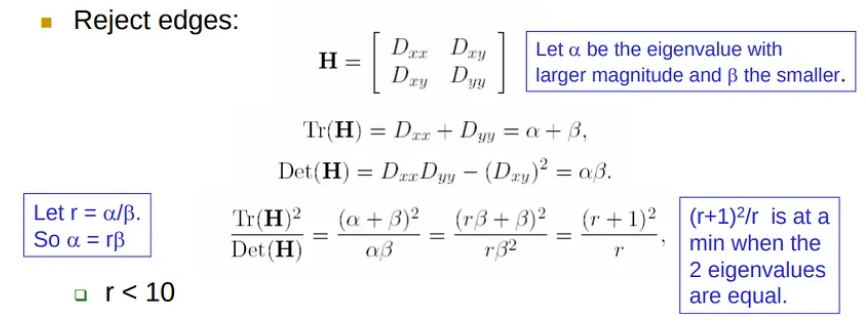

**Descripción de keypoints**

 A la hora de describir los keypoints detectados en el paso previo, se seguirán los siguientes pasos:
  * Todo keypoint tiene asociado la posición $(x,y)$ y el $σ$ de la diferencia gaussiana empleada (diámetro).
  * Localizamos la orientación del gradiente en dicho keypoint
  * Tomo una ventana centrada en el keypoint de tamaño $1.5σ$ (anchura y altura del valor indicado).
  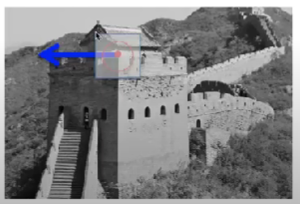
  * Alineo la dirección del gradiente con el vector $(1,0)$.

  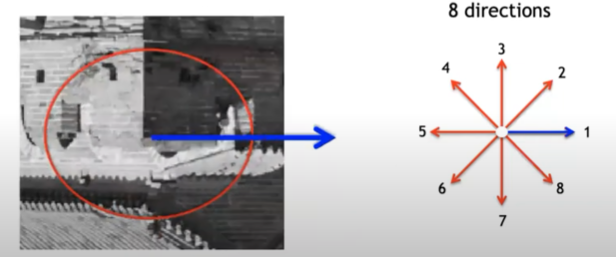

* Defino una partición sobre la ventana conformada por **16 bloques** del mismo tamaño, **cada bloque siendo un grid 4x4**, y calculo el histograma de gradientes de cada bloque. Finalmente, concateno todos los histogramas (cada histograma es un vector de 8 elementos), obteniendo un **vector descriptor de 128 elementos**. Este descriptor se normalizará, se limita el valor máximo de cada componente a 0.2, y se renormaliza, reduciendo los efectos causados por cambios de brillo en la imagen.

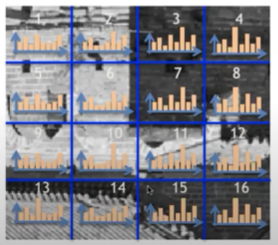

**Nota**: el histograma muestra información de los gradientes en ocho direcciones específicas, indicando, para cada dirección, la suma de las magnitudes de todos aquellos gradientes en dicha dirección.

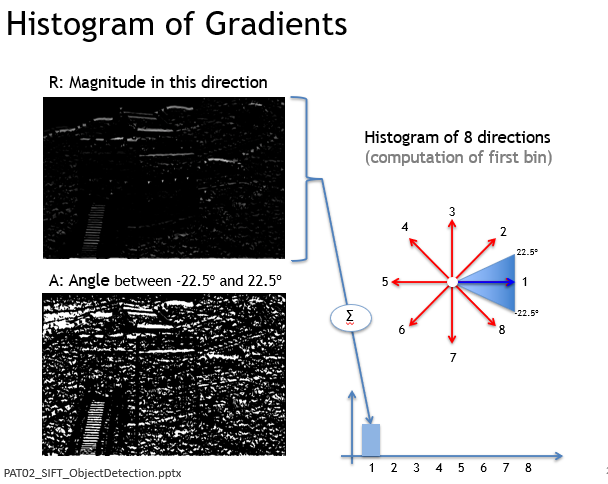

Tras toda esta explicación, procedamos a implementar el código correspondiente.

Empecemos definiendo el método `siftPoints`, encargado de aplicar SIFT para detección y descripción de los keypoints, especificando el valor del parámetro `nfeatures`, nº máximo de keypoints a extraer, y ordenados por sus puntuaciones, medidas como el contraste local.

In [125]:
def siftPoints(im,nfeatures=5000):
  sift = cv2.SIFT_create(nfeatures=nfeatures)
  #Procedemos a encontrar los keypoints y sus descriptores en un solo paso
  kp, ds = sift.detectAndCompute(im, None)
  return kp,ds

In OpenCV the output of a matching process is a vector of records. Each record provides information about the indexes of the matched KeyPoints and the distance between them.

A la hora de emparejar los keypoints de dos imágenes entre sí, podemos seguir tres estrategias diferentes, partiendo de los descriptores SIFT de dichas imágenes:
* **Fuerza Bruta**: para cada descriptor SIFT de una imagen, le asociamos el descriptor SIFT de la otra imagen más próximo, usando una determinada norma para calcular dicha distancia. Por defecto, y para SIFT, suele funcionar bien **cv.NORM_L2**, la norma usual. Al fin y al cabo, los descriptores SIFT son puntos en un espacio N-dimensional, por lo que estamos buscando que cada pareja de puntos considerada sean dos puntos muy próximos entre sí.
* **Fuerza Bruta con Validación Cruzada** : Similar al método previo, pero asegurando **consistencia**, tal que si el descriptor $i$ de la imagen A tiene asociado el descriptor $j$ de la imagen B, este último descriptor $j$ también tiene que tener asociado como mejor descriptor en la imagen A el descriptor $i$, entregando un único emparejamiento $(i,j)$ en el caso de que se cumpla lo anteriormente comentado.
* **Lowe's ratio test** : supone emplear **fuerza bruta con validación cruzada**, pero seleccionando ahora los 2 mejores emparejamientos de cada descriptor (vecinos más próximos). Posteriormente, se calcula el ratio **distancia_mejor_vecino / distancia_segundo_mejor_vecino**, y se filtra usando un determinado umbral sobre dicho ratio. Yo me decanto por usar un umbral de 0.75. Esta umbralización nos permitirá asegurarnos que el mejor emparejamiento sea significativamente mejor que el segundo mejor, aumentando la fiabilidad de las coincidencias. Si la distancia a los dos mejores vecinos fuese muy parecida, descartaríamos el emparejamiento al no haber una coincidencia clara.

Para seguir cualquiera de las estrategias de emparejamiento comentadas, se dispone de los siguientes métodos:
* `cv2.BFMatcher(normTtype = NORM_L2, crossCheck = false)` : construcción del objeto encargado de realizar el emparejamiento usando fuerza bruta, con la norma especificada (por defecto, norma L2), y validación cruzada, en el caso de que se active `crossCheck`, por defecto `False`.
* `match` : método invocado por el objeto creado en el paso previo, que requiere como parámetros los descriptores de los keypoints de las dos imágenes, realizando el emparejamiento adecuado. Se obtiene como salida un vector de objetos `cv2.DMatch`, cada uno representando un emparejamiento entre dos descriptores, y almacenando información sobre dicha correspodencia :     
  - `DMatch.distance` : distancia entre descriptores
  - `DMatch.queryIdx` : índice del descriptor en la 1ª imagen
  - `DMatch.trainIdx` : índice del descriptor en la 2ª imagen


Para visualizar los emparejamientos obtenidos sobre las imágenes, emplearemos el método `drawMatches()`, con los siguientes parámetros:
* `img1` : Primera imagen
* `keypoints1` : Keypoints de la primera imagen
* `img2` : Segunda imagen
* `keypoints2` : Keypoints de la segunda imagen
* `matches1to2` : Coincidencias de la primera imagen con la segunda

In [126]:
# This function display the KeyPoints of an image
def showKP(im,kp,title):
  im_with_keypoints = im.copy()
  #Dibujamos los puntos claves sobre la imagen original
  cv2.drawKeypoints(im, kp, im_with_keypoints, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG+cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  displayIm(im_with_keypoints,title,1)

# This function display the matches between two images
def showMatches(im1,kp1,im2,kp2,matches, N, title='Matches'):
  #Visualizamos los primeros N matches, es decir, los N primeros mejores emparejamientos, aquellos de menor distancia
  imBF=cv2.drawMatches(im1, kp1, im2, kp2, matches[:N], None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS+cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  displayIm(imBF,title,2)

#This function compute matches between descriptors of two images
#Recibe como parámetro, los descriptores de los keypoints de ambas imágenes, y la técnica de emparejamiento a emplear
def matching(ds1,ds2,FlagMode='BF+CC'):
  #Entre las diferentes técnicas de emparejamiento...
  if FlagMode=='BF':
    #Emparejamiento por fuerza bruta

    #Comenzamos creando el objeto BFMatcher especificando la norma empleada para medir la distancia, y usando el valor por defecto de crossCheck
    bf = cv2.BFMatcher(cv2.NORM_L2)
    #Identificamos los keypoints de ambas imágenes entre sí adecuadamente
    matches = bf.match(ds1,ds2)
    #Ordenamos los emparejamientos de menor a mayor distancia
    matches = sorted(matches, key=lambda x: x.distance)

    return matches

  elif FlagMode=='BF+CC':
    #Fuerza bruta, pero usando 'cross_check'

    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    #Identificamos los keypoints de ambas imágenes entre sí adecuadamente
    matches = bf.match(ds1,ds2)
    #Ordenamos los emparejamientos de menor a mayor distancia (mejor a peor emparejamiento)
    matches = sorted(matches, key=lambda x: x.distance)

    return matches

  elif FlagMode=='KNN':
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck = False)
    #Encontramos los k mejores emparejamientos para cada descriptor de la imagen, usando fuerza bruta
    #Devuelve una lista de listas, cada sublista con k objetos DMatch
    matches = bf.knnMatch(ds1, ds2, k=2)

    good = []

    for m, n in matches:
      #Comparamos lo cerca que está el mejor emparejamiento en comparación con el segundo mejor (al usar k=2)
      if (m.distance/n.distance) < 0.75:
        good.append(m)

    #Ordenamos de menor a mayor distancia
    good = sorted(good, key=lambda x: x.distance)

    return good
  else:
    return print('Error in Matching mode')


Tras realizar la implementación correspondiente, procedemos a definir el nº de emparejamientos a visualizar, parámetro que requiere el método `showMatches`.

In [127]:
numberOfmatches = 100

Extraemos y visualizamos los keypoints en cada una de las imágenes, recordando realizar SIFT sobre la imagen en escala de grises, y empleando la imagen a color a la hora de  visualizar los puntos de interés.

In [128]:
'''
Leemos ambas imágenes tanto en RGB como en escala de grises, ya que...
  * SIFT extrae keypoints a partir de imágenes en escala de grises
  * Dibujaremos los keypoints extraídos sobre la imagen a color
'''

img1=cv2.resize(readIm(get_image('IMG_20220312_102940_S.jpg'),1), (0,0), fx=0.5, fy=0.5)
im1=cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
img2=cv2.resize(readIm(get_image('IMG_20220312_102944_S.jpg'),1), (0,0), fx=0.5, fy=0.5)
im2=cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)

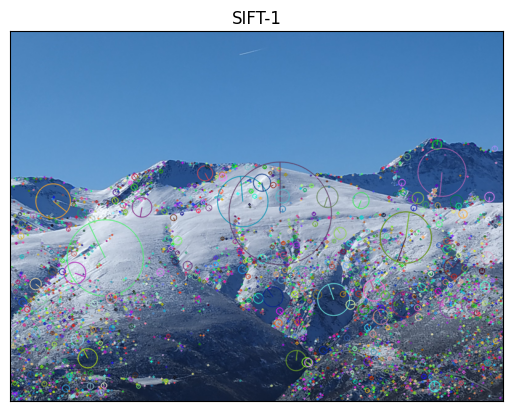

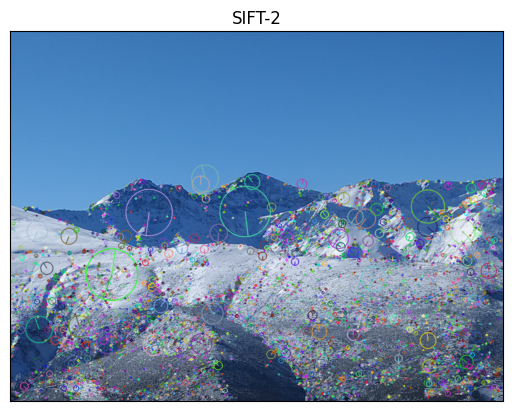

In [129]:
#Deteccion y descripcion de los keypoints de ambas imágenes, en escala de grises
kp1, ds1 = siftPoints(im1)
kp2, ds2 = siftPoints(im2)

#Mostramos los keypoints de ambas imágenes
showKP(img1,kp1,'SIFT-1')
showKP(img2,kp2,'SIFT-2')

In [130]:
print(" Primera imagen ")
print("- Nº keypoints detectados : ",len(kp1))
print("- Nº keypoints descritos : ",len(ds1))

print("\n Segunda imagen ")
print("- Nº keypoints detectados : ",len(kp2))
print("- Nº keypoints descritos : ",len(ds2))

 Primera imagen 
- Nº keypoints detectados :  3838
- Nº keypoints descritos :  3838

 Segunda imagen 
- Nº keypoints detectados :  3863
- Nº keypoints descritos :  3863


In [131]:
print("Tamaño del descriptor de cada keypoint : ",len(ds1[0]))

Tamaño del descriptor de cada keypoint :  128


Efectivamente, tal y como comenté, cada descriptor SIFT se corresponde con un vector de 128 elementos.

Visualizamos ahora los emparejamientos obtenidos empleando tanto **Fuerza Bruta con CrossCheck** como **Lowe's ratio test**.

Nº de parejas obtenidas usando BF with CrossCheck:  1575


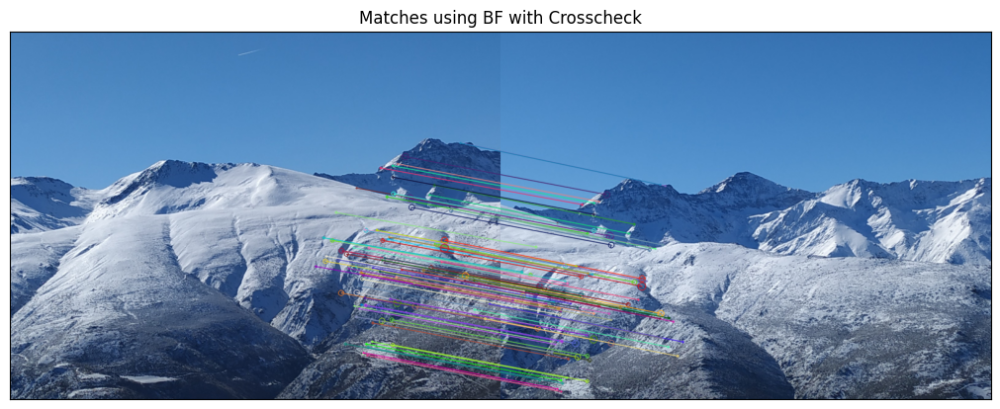

In [132]:
#visualizamos ahora el emparejamiento de keypoints entre ambas imágenes, usando las técnicas de Brutal-Force with CrossCheck
# y usando 2NN

#BF with CrossCheck
matches = matching(ds1,ds2,FlagMode='BF+CC')
print("Nº de parejas obtenidas usando BF with CrossCheck: ",len(matches))

#Mostramos los 100 primeros emparejamientos entre las dos imágenes a color
showMatches(img1,kp1,img2,kp2,matches, numberOfmatches, title='Matches using BF with Crosscheck')

* Si hubiésemos usado únicamente **Fuerza Bruta, sin CrossCheck**, todos los keypoints de la 1ª imagen se hubiesen enlazado con algún keypoint de la 2ª imagen, obteniendo por ende tantas parejas como keypoints se detecten en la 1ª imagen.
* Al usar **BF con CrossCheck**, se realizaba una comprobación extra, preservando únicamente aquellas parejas que pasen el criterio bidireccional. Por esta razón, el nº de keypoints de la 1ª imagen que finalmente se han identificado con alguno de la segunda es inferior al nº inicial de keypoints detectados en la imagen.

In [133]:
print("Nº de keypoints que se detectaron en la 1º imagen : ",len(kp1))
print("Nº de keypoints de la 1ª imagen que se han identificado con algún keypoint de la otra imagen : ",len(matches))

Nº de keypoints que se detectaron en la 1º imagen :  3838
Nº de keypoints de la 1ª imagen que se han identificado con algún keypoint de la otra imagen :  1575


Nº de parejas obtenidas usando Lowe's Ratio Test:  903


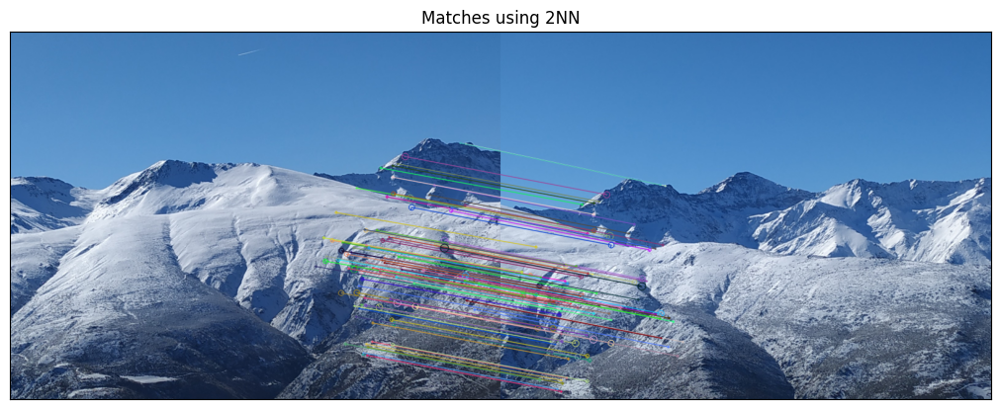

In [134]:
#Ahora emparejamos usando 2NN
matches = matching(ds1,ds2,FlagMode='KNN')
print("Nº de parejas obtenidas usando Lowe's Ratio Test: ",len(matches))

#Mostramos los 100 primeros emparejamientos entre las dos imágenes a color
showMatches(img1,kp1,img2,kp2,matches, numberOfmatches, title='Matches using 2NN')

Lo primero que podemos observar es el hecho de que el nº de emparejamientos realizados usando Lowe's Ratio Test (**903**) es claramente inferior al obtenido usando BF con validación cruzada (**1575**). Tal y como se comentó anteriormente, ésta última estrategia no solo aplica BF con CrossCheck (emparejamientos consistentes), sino que posteriormente procede a tomar únicamente aquellos emparejamientos que sean claros, es decir, que el mejor vecino esté mucho más próximo que el segundo mejor, descartando el resto. Esto es, si se detectan dos zonas de la 2ª imagen muy similares a una determinada región de la 1º, no se realiza ningún emparejamiento, ya que no está claro con cual de las dos zonas (a las que se asemeja mucho) se identifica realmente.

Las dos imágenes sobre las que se realiza el emparejamiento hacen referencia a un mismo objeto, en este caso, a unas montañas, pero desde diferentes puntos de vista. A pesar de ello, se emparejan keypoints que describen, efectivamente, una misma zona del objeto visualizado en las imágenes, lo que refleja claramente las propiedades típicas de SIFT: invariante a traslaciones, rotaciones y escalado, y robusto a cambios de perspectiva y variaciones de brillo.

## <font color='blue'>LBP (Local Binary Patterns)

<font color='blue'>Ahora, vamos a hacer lo mismo de antes, pero empleando las características LBP (del paquete `mahotas`: `mahotas.features.lbp`). Para ello debemos crear una pequeña ventana ($7\times7$ pixels) centrada en torno a los SIFT keypoints detectados, y calcular el vector de características correspondiente (empleando `radius=1` y `points=8`).

<font color='blue'>¿Posee este vector de características el tamaño indicado en teoría? Si no es así, ¿a qué se puede deber?


In [135]:
!pip install mahotas

A la hora de emplear el descriptor LBP, se seguirán los siguientes pasos:
1. Suponiendo que empleamos una ventana de tamaño 3x3 (`radius=1` y `points=8`), centramos dicha ventana en un determinado píxel, y comparamos la intensidad de los píxeles vecinos dentro de la ventana con respecto a la intensidad del píxel central:
  - Ponemos a 0 todos aquellos píxeles vecinos con una intensidad inferior estrictamente a la del píxel central.
  - Ponemos a 1 todos aquellos vecinos con intensidad igual o superior.

2. Tras el paso previo, obtendremos ocho bits, es decir, un byte, por lo que convertimos a decimal, comenzando por cualquiera de los bits, y en sentido horario u antihorario. Es importante que el sentido y el bit por el que empecemos (bit menos significativo) sea siempre el mismo a la hora de describir los diferentes keypoints de nuestra imagen.

La siguiente imagen ilustra los dos primeros pasos comentados, empezando en este caso por el bit situado en la esquina superior izquierda, y en sentido horario:

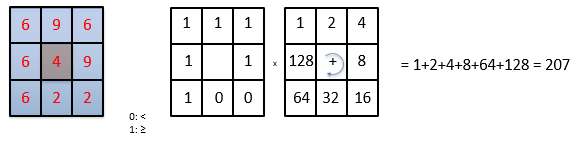

3. Defino una nueva representación visual, donde 0 es un **círculo blanco**, y 1 es un **círculo verde**.

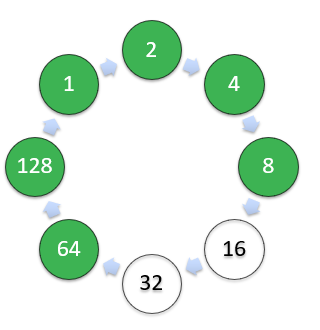

Esto representa un determinado patrón, que lleva asociado un determinado nº de cambios (ya sea de blanco a verde o viceversa). En este caso, 2 cambios.

Todos los posibles patrones que puede seguir se encuentran agrupados :      
- Patrones con 0 cambios (2 posibilidades).
- Patrones con 2 cambios (no hay patrones que lleven consigo 1 sólo cambio, porque si hubiese, por ejemplo, un sólo círculo verde, esto supondría cambiar de blanco a verde, y luego de verde a blanco, lo que son 2 cambios). Existirán 56 posibles patrones que sufran 2 cambios.
- Patrones no uniformes :  referencian el resto de posibles patrones, que experimentan cambios superiores a 2 (4 cambios, 6 u 8). No existen patrones con 10 o más cambios.

Los dos primeros grupos se suelen denominar patrones uniformes (nº de cambios muy pequeño), mientras que al resto no uniformes, debido a que experimentan un nº de cambios mas alto.


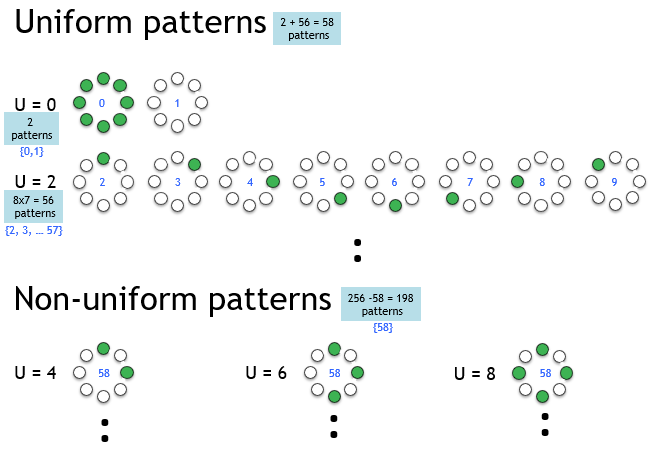

Codificamos los diferentes patrones que se pueden obtener, tal y como se indica en la imagen:
- **0 y 1** para los dos patrones con 0 cambios, respectivamente
- **[2, 3, ... 57]** para los patrones con 2 cambios
- Todos los patrones no uniformes se codifican de la misma forma, en este caso, con el número **58**.

4. Tras codificar el patrón asociado a cada uno de los píxeles de la imagen, definimos un histograma con 59 valores (índices empleados para codificar los diferentes patrones anteriormente comentados, de 0 a 58), e indicamos el nº de patrones detectados en la imagen para cada índice.

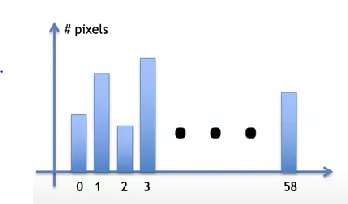

Esto último será justamente el vector de características empleado para describir la imagen, y conformado por 59 elementos. Imágenes similares tendrán características LBP similares.

Sin embargo, en la práctica, en lugar de emplear LBP sobre toda la imagen,
desplazando la ventana por cada uno de los píxeles y generando un único histograma, aplicamos LBP localmente, es decir, definimos una partición sobre la imagen, y aplicamos LBP sobre cada trozo, equivalente a obtener un histograma por cada región. Finalmente, concatenamos todos los histogramas obtenidos, de forma que el vector de características de la imagen estará conformado por $nº particiones × 59$ elementos.

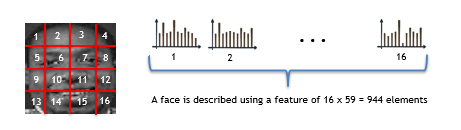

Como queremos describir usando LBP los diferentes keypoints, se tomará una ventana 7x7 centrada en cada keypoint, y aplicaremos LBP sobre la ventana, considerando en este caso entornos 3x3 para cada uno de los píxeles de la ventana.

Por ende, cada keypoint se describirá mediante un vector de 59 elementos (histograma obtenido sobre la ventana centrada en dicho keypoint), dando lugar a la descripción de la imagen original mediante un vector de características de tamaño $\text{nº de keypoints} \times 59$.

Para aplicar LBP sobre cada una de las ventanas, usaremos el método `mahotas.features.lbp()`, que requiere los siguientes parámetros:
- `image`  : imagen sobre la que aplicar LBP. En nuestro caso, la ventana 7x7 centrada en cada keypoint.
- `radius` : radio, en píxeles, del entorno a considerar sobre cada píxel de la ventana.
- `points` : nº de píxeles vecinos a considerar dentro del entorno especificado con el parámetro previo. En este caso, los ocho que rodean al píxel central.

In [136]:
import mahotas

#Calcular descriptores LBP de los keypoints de la imagen indicados
def descriptorLBP(img, keypoints, windowSize=7):
  #Calculamos el radio de la ventana a considerar, usando la división entera '//'
  mitad_ventana = windowSize//2
  #Tomamos el nº de filas y columnas de la ventana
  anchura = img.shape[1]
  altura = img.shape[0]

  lbp_features=[] #vector de características LBP de cada keypoint (detectado con SIFT)
  keypoints_descritos=[] #lista que almacena los keypoints que han sido finalmente descritos
  for kp in keypoints:
    #Tomamos coordenadas del píxel seleccionado como keypoint
    x, y = int(kp.pt[0]), int(kp.pt[1])

    #Comprobamos que la ventana especificada no se salga de la imagen
    #Puede ocurrir que nos salgamos en horizontal, o en vertical
    if( x-mitad_ventana<0 or x+mitad_ventana>=anchura or y-mitad_ventana<0 or y+mitad_ventana>=altura):
      continue #Pasamos al siguiente keypoint

    #La ventana se mantiene dentro de la imagen, procedemos a aplicar LBP sobre la ventana
    window = img[y - mitad_ventana:y + mitad_ventana + 1, x - mitad_ventana:x + mitad_ventana + 1]
    lbp = mahotas.features.lbp(window, radius=1, points=8)

    #Añadimos descripción del keypoint
    lbp_features.append(lbp)
    #Añadimos keypoint descrito
    keypoints_descritos.append(kp)

  #Importante transformar la lista en un array de Numpy, para evitar problemas en el formato a la hora de usar el método match
  return np.array(lbp_features, dtype=np.float32), keypoints_descritos

Usamos el método previo para obtener los vectores de características de las dos imágenes.

In [137]:
#Descripción LBP de los keypoints de la 1ª imagen
ds1, new_kp1 = descriptorLBP(im1, kp1)
#Descripción LBP de los keypoints de la 2ª imagen
ds2, new_kp2 = descriptorLBP(im2, kp2)

In [138]:
print("Nº keypoints de la 1ª imagen : ",len(kp1))
print("Nº de keypoints de la 1ª imagen finalmente descritos : ",len(new_kp1))
print("Nº elementos del vector de características de la 1ª imagen: ",len(ds1))
print("Nº elementos del vector descriptor de cada keypoint: ",len(ds1[0]))

Nº keypoints de la 1ª imagen :  3838
Nº de keypoints de la 1ª imagen finalmente descritos :  3834
Nº elementos del vector de características de la 1ª imagen:  3834
Nº elementos del vector descriptor de cada keypoint:  36


Podemos observar que el nº de keypoints finalmente descritos es inferior al nº de keypoints detectados inicialmente. Esto se debe a que no se han descrito, usando LBP, aquellos keypoints situados cerca del borde, al salirse de la imagen la ventana 7x7 centrada en cada uno de ellos.

In [139]:
print("Nº keypoints de la 2ª imagen : ",len(kp2))
print("Nº de keypoints de la 2ª imagen finalmente descritos : ",len(new_kp2))
print("Nº elementos del vector de características de la 2ª imagen: ",len(ds2))
print("Nº elementos del vector descriptor de cada keypoint: ",len(ds2[0]))

Nº keypoints de la 2ª imagen :  3863
Nº de keypoints de la 2ª imagen finalmente descritos :  3859
Nº elementos del vector de características de la 2ª imagen:  3859
Nº elementos del vector descriptor de cada keypoint:  36


Lo mismo ocurre a la hora de describir los keypoints detectados en la segunda imagen, descartando alguno de ellos por la misma razón comentada.

Además, se ha tomado una nueva lista de keypoints para cada imagen, equivalente a la lista inicial de keypoints, pero eliminando aquellos que no han sido descritos, con el objetivo de que las listas de keypoints/descriptores tengan el mismo tamaño y no haya ningún problema a la hora de realizar/visualizar el emparejamiento, sobre todo con el tema de la indexación.

Una vez obtenidas las descripciones de los keypoints, procedemos a realizar el emparejamiento usando **BF with CrossCheck** y **Lowe's Ratio Test**.

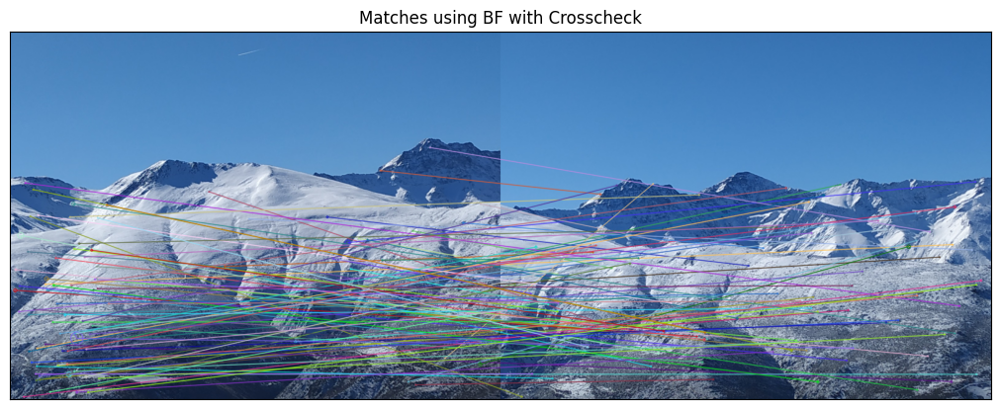

In [140]:
#BF with CrossCheck
matches = matching(ds1,ds2,FlagMode='BF+CC')
#Mostramos los 100 primeros emparejamientos entre las dos imágenes a color
showMatches(img1,new_kp1,img2,new_kp2,matches, numberOfmatches, title='Matches using BF with Crosscheck')

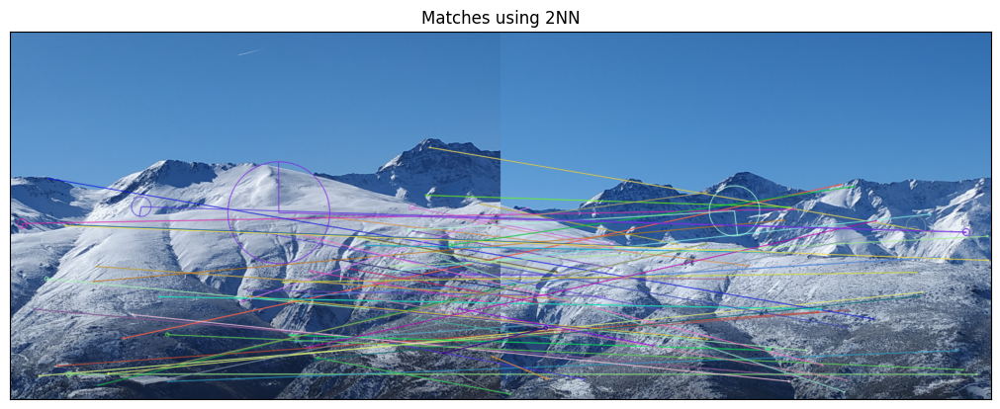

In [141]:
#Ahora emparejamos usando 2NN
matches = matching(ds1,ds2,FlagMode='KNN')
#Mostramos los 100 primeros emparejamientos entre las dos imágenes a color
showMatches(img1,new_kp1,img2,new_kp2,matches, numberOfmatches, title='Matches using 2NN')

Podemos observar que el emparejamiento realizado con LBP es mucho peor que el correspondiente en SIFT. Esto es, se emparejan zonas de ambas imágenes que locamente son muy similares, pero que sin embargo no referencian a una misma parte del objeto visualizado.

Esto se debe a que **LBP** es un descriptor mucho más simple, que tal y como se comentó, busca detectar y contabilizar los patrones que se repiten en la imagen, información realmente útil para **detectar y describir texturas locales** en imágenes, y no para llevar a cabo un emparejamiento de keypoints entre dos imágenes.

## <font color='blue'>HOG (Histogram of oriented gradients)

<font color='blue'>Ahora hacemos lo mismo, pero con la implementación de HOG disponible en `skimage.feature`. Se deben emplear $9$ orientaciones, $8\times8$ pixels por celda, y $2\times2$ celdas por bloque (importante hacer _resize_ de la ventana/región de $7\times7$ al tamaño estándar de HOG: $64\times128$ pixels). ¿Cuál es la dimensionalidad de este vector de características y por qué?

HOG lleva a cabo una descripción parecida a la realizada por SIFT, pero con algunas diferencias, ya que como veremos, HOG es un descriptor global al emplear un grid de un tamaño considerable, conformado por celdas uniformemente espaciadas.

El proceso de descripción de cada uno de los keypoints (ya detectados) consta de los siguientes pasos:

  1. Al igual que hicimos al usar LBP, debemos comprobar que la ventana 7x7 centrada en el keypoint no se salga de la imagen. En caso contrario, descartamos el keypoint (no se describe).
  2. **Redimensionamos** la ventana 7x7 a 64x128 (tamaño estándar de HOG).
  3. Definimos una partición sobre la ventana usando **celdas 8x8**.
  4. Creamos el **histograma de gradientes** para cada una de las celdas, trabajando con 9 orientaciones (o direcciones), y que contiene, para cada dirección, la sumatoria de las magnitudes de los gradientes con dicha orientación.



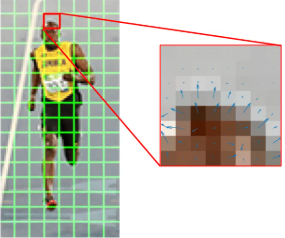

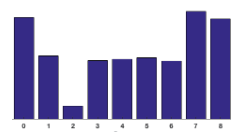

  5. Para que la descripción de cada keypoint sea independiente a cambios de brillo, necesitaremos normalizar los histogramas de gradientes. En lugar de normalizar cada histograma por separado (vector de 9 elementos), se normaliza un bloque de mayor tamaño, en este caso, un bloque 16x16, conformado por 4 celdas 8x8, por lo que dicho bloque contendrá 4 histogramas. Se concatenan los 4 histogramas almacenados en el bloque, obteniendo un vector de 36 elementos, y procedemos a normalizarlo.

  Ese bloque sobre el que aplicamos normalización se desplaza 8 píxeles, volviendo a normalizar el vector 36x1 calculado en dicha ventana.



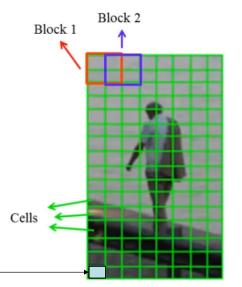

6. Finalmente, concatenamos los vectores de 36 elementos de cada bloque. Como cada bloque es un grid 16x16, desplazado 8 píxeles cada vez, esto supondrá un total de 7 en horizontal y 15 en vertical, haciendo un total de **105 posiciones** por las que pasará el bloque inicial a lo largo de la ventana. Por ende, el **vector descriptor del keypoint** estará conformado por $36 \times 105 = 3780$ elementos.

In [142]:
from skimage.feature import hog
from skimage.transform import resize

#Calcular descriptores HOG de los keypoints de la imagen indicados
def descriptorHOG(img, keypoints, windowSize=7):
  #Calculamos el radio de la ventana a considerar, usando la división entera '//'
  mitad_ventana = windowSize//2
  #Tomamos el nº de filas y columnas de la ventana
  anchura = img.shape[1]
  altura = img.shape[0]

  hog_features=[] #vector de descriptores HOG de los keypoints
  keypoints_descritos=[] #lista que almacena los keypoints que han sido finalmente descritos
  for kp in keypoints:
    #Tomamos coordenadas del píxel seleccionado como keypoint
    x, y = int(kp.pt[0]), int(kp.pt[1])

    #Comprobamos que la ventana especificada no se salga de la imagen
    #Puede ocurrir que nos salgamos en horizontal, o en vertical
    if( x-mitad_ventana<0 or x+mitad_ventana>=anchura or y-mitad_ventana<0 or y+mitad_ventana>=altura):
      continue #Pasamos al siguiente keypoint

    #La ventana se mantiene dentro de la imagen. Redimensionamos la ventana al tamaño por defecto sobre el que se aplica HOG
    window = img[y - mitad_ventana:y + mitad_ventana + 1, x - mitad_ventana:x + mitad_ventana + 1]
    window = cv2.resize(window,(64,128))

    #Aplicamos HOG sobre la ventana 64x128
    hog_descriptor = hog(window, cells_per_block = (2,2), transform_sqrt=True)

    #Añadimos descripción del keypoint
    hog_features.append(hog_descriptor)
    #Añadimos keypoint descrito
    keypoints_descritos.append(kp)

  #Importante transformar la lista en un array de Numpy, para evitar problemas en el formato a la hora de usar el método match
  return np.array(hog_features, dtype=np.float32), keypoints_descritos

Una vez implementado el método encargado de describir, usando HOG, los keypoints detectados inicialmente sobre la imagen, procedemos a comprobar que todo funcione correctamente.

In [143]:
#Descripción HOG de los keypoints de la 1ª imagen
ds1, new_kp1 = descriptorHOG(im1, kp1)

In [144]:
#print(len(ds1),len(new_kp1),len(kp1))
print("Nº de keypoints finalmente descritos : ",len(new_kp1))
print("Tamaño del descriptor de un keypoint : ",len(ds1[0]))

Nº de keypoints finalmente descritos :  3834
Tamaño del descriptor de un keypoint :  3780


El nº de keypoints finalmente descritos es similar al obtenido en el apartado previo donde aplicábamos LBP, ya que se siguen considerando inicialmente ventanas 7x7 sobre cada keypoint, descartando aquellos cuya ventana se salga de la imagen. Además, tal y como se comentó, el vector descriptor de cada keypoint tiene 3780 elementos.

Describimos también los keypoints de la 2ª imagen.

In [145]:
ds2, new_kp2 = descriptorHOG(im2, kp2)

In [146]:
#print(len(ds2),len(new_kp2),len(kp2))
print("Nº de keypoints finalmente descritos : ",len(new_kp2))
print("Tamaño del descriptor de un keypoint : ",len(ds2[0]))

Nº de keypoints finalmente descritos :  3859
Tamaño del descriptor de un keypoint :  3780


Una vez descritos los keypoints de ambas imágenes, procedemos a realizar los emparejamientos correspondientes, siguiendo las dos estrategias ya comentadas.

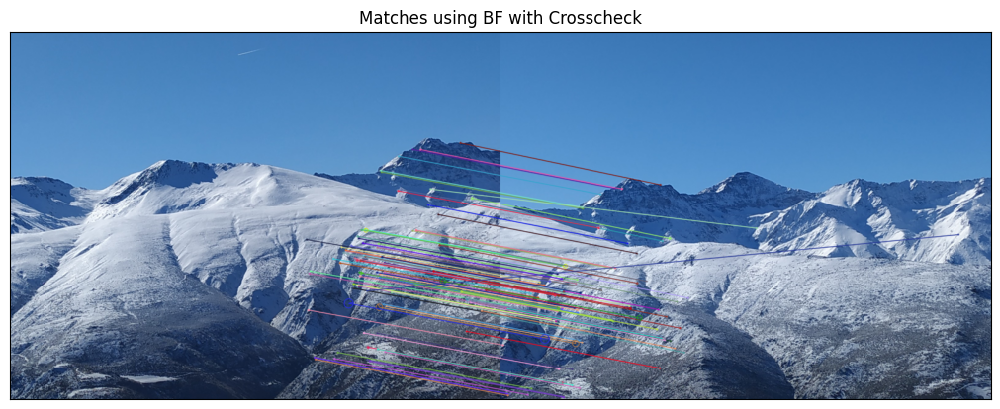

In [147]:
#BF with CrossCheck
matches = matching(ds1,ds2,FlagMode='BF+CC')
#Mostramos los 100 primeros emparejamientos entre las dos imágenes a color
showMatches(img1,new_kp1,img2,new_kp2,matches, numberOfmatches, title='Matches using BF with Crosscheck')

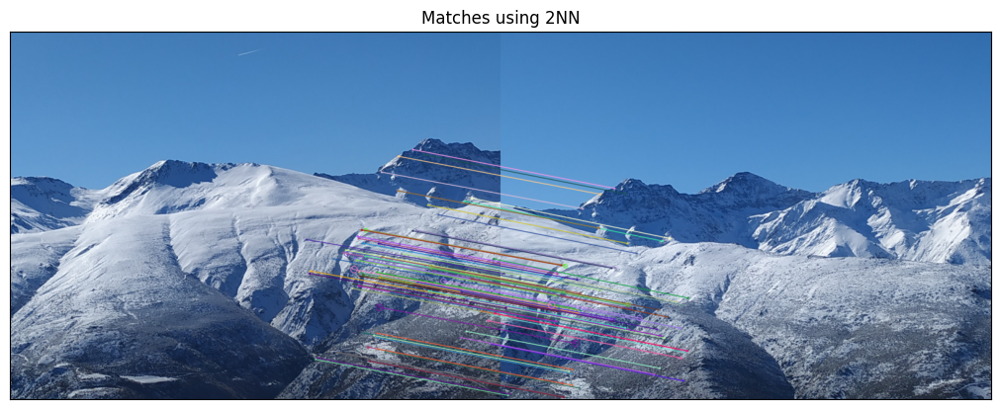

In [148]:
#Ahora emparejamos usando 2NN
matches = matching(ds1,ds2,FlagMode='KNN')
#Mostramos los 100 primeros emparejamientos entre las dos imágenes a color
showMatches(img1,new_kp1,img2,new_kp2,matches, numberOfmatches, title='Matches using 2NN')

<font color='blue'> ¿Cuál de los descriptores anteriores parece más adecuado para _keypoint matching_ y por qué?

# <font color='blue'>**Ejercicio 3:** Creación de panoramas/mosaicos (_Image Stitching_) empleando homografías (5 puntos)

<font color='blue'>Ahora vamos a calcular homografías entre imágenes y usarlas para construir un mosaico/panorama. Para calcular la homografía entre dos imágenes, hay que llamar a la función `cv2.findHomography()`, que toma como entrada las listas de _keypoints_ y los matches/emparejamientos encontrados. Se debe usar RANSAC para realizar una estimación robusta.

# Funcionamiento de una homografía

Una homografía, a diferencia de una transformación afín (rotación, traslación, escalado...), se expresa matricialmente mediante una matriz $3 \times 3$ cuya 3ª fila puede contener las entradas que queramos, a diferencia de lo que ocurría con cualquier transformación afín, tal que la última fila se fijaba con las entradas $(0,0,1)$.

Además, se empleaba una representación homogénea de los puntos 2D, tal que todo pixel $(x,y)$ tendrá coordenadas homogéneas ($\tilde{x},\tilde{y},\tilde{z})$, con la condición siguiente:
$$x=\frac{\tilde{x}}{\tilde{z}}\hspace{1cm}y\hspace{1cm}y=\frac{\tilde{y}}{\tilde{z}}$$
Concluimos, por tanto, que todo punto 2D $(x,y)$ podrá tener, como **coordenadas homogénea**s, cualquier **punto de la forma** $(λx,λy,λ)$, siendo $λ\neq0$, es decir, cualquier punto no nulo perteneciente a la recta en $\mathbb{R}^3$ que pasa por el origen y por el punto $(x,y,1)$ :

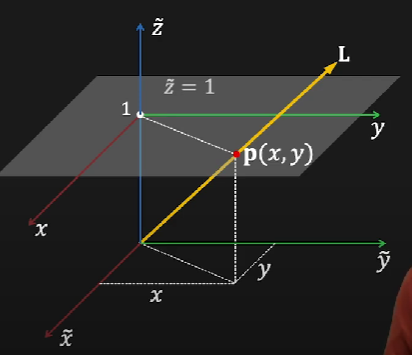

Una **homografía** nos permite, básicamente, **proyectar un plano en otro (plano fuente y plano destino, respectivamente) a través de un determinado punto**, denominado foco de proyección, similar a colocar la cámara en un determinado punto y visualizar ese plano inicial a través de la cámara, observándolo finalmente a través del cristal de dicha cámara (el cual representa el plano destino).

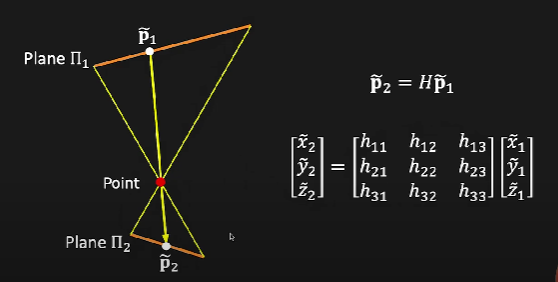

Además, debido a la definición de coordenadas homogéneas de un punto 2D, una homografía será **invariante al escalado del punto original** a proyectar expresado **en coordenadas homogéneas**. Por tanto, a la hora de definir una homografía, tendremos que fijar una determinada escala, proceso que suele llevarse a cabo **normalizando el vector de entradas** de la matriz de la homografía, lo que supone un total de **8 grados de libertad** (parámetros a determinar), y no 9  como se esperaba inicialmente.

Tras fijar la escala, la imagen estará situada en un plano horizontal de $\mathbb{R}^3$ con una altura (con respecto al eje Z) fija.

# Homografías para crear imagen panorámica

Cuando disponemos de varias imágenes, todas ellas ilustrando un mismo objeto pero realizando diferentes giros con la cámara (diferentes orientaciones), podemos crear una **imagen panorámica** ayudándonos de las homografías, siempre y cuando **mantegamos fijo el punto de vista**.

De forma resumida, se tomará una de las imágenes como **imagen central**, situada en un determinado plano horizontal del espacio tridimensional (coordenadas homogéneas), se **fijará el foco de proyección** o punto de vista, y **se observará cada una de las imágenes restantes con orientaciones diferentes**, empleando como plano destino la imagen central. Este procedimiento de seleccionar una imagen como la central se debe justamente al hecho de que cuanto mayor sea el nº de homografías que se apliquen sobre una determinada imagen, mayor será la deformación. Por ende, en lugar de calcular las homografías de un extremo al otro, se calculan desde los extremos al centro, que supone combinar un menor nº de homografías, y por ende, imágenes resultantes menos deformes.

La orientación o dirección en la que la camará estará mirando, para cada imagen, se puede especificar mediante un vector unitario 3D o especificando el punto de la imagen donde estamos enfocando la cámara. Todo este proceso se ilustra de forma clara en la siguiente imagen :

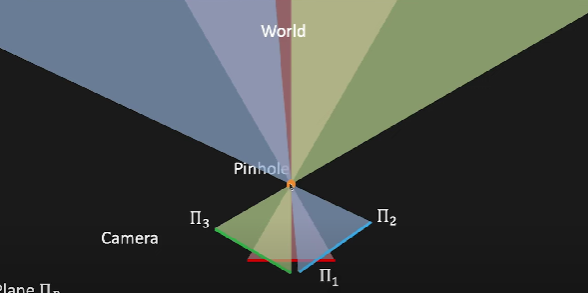

Finalmente, necesitamos simplementar construir una **última homografía**, que será la que nos permite **proyectar todas las imágenes finales sobre un mismo plano**, construyendo así la imagen panorámica. Iré explicando todo con mayor detalle conforme vayamos avanzando a lo largo del código fuente implementado.

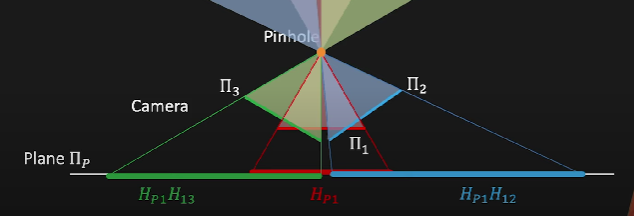

# Cálculo de la homografía entre dos imágenes

A la hora de calcular la homografía que nos permite proyectar una imagen sobre la otra, será necesario asignar valores a los 8 parámetros desconocidos de la matriz de la homografía buscada, por lo que tendremos que conseguir un mínimo de 8 ecuaciones, que nos permitirán obtener una solución (entradas de la matriz).

Para abordar este problema, queremos localizar la mejor proyección, que será aquella que proyecte los keypoints de la imagen de origen sobre los keypoints de la imagen destino con los que se identificaron. En este caso, será necesario **un mínimo de 4 parejas de puntos emparejados**, equivalente a conocer las proyecciones (usando esa homografía inicialmente desconocida) de 4 puntos de la imagen inicial sobre la imagen destino.

A partir de ahora, usaremos un escalado de 1 para simplificar el proceso, lo que supone el hecho de que todo punto 2D $(x,y)$ tenga coordenadas homogéneas $(x,y,1)$.

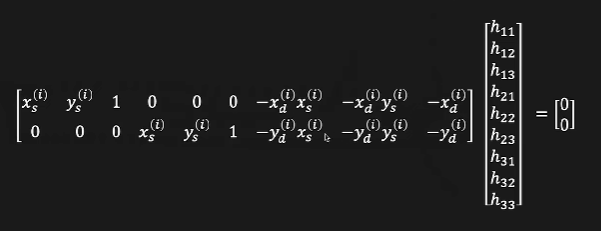

La imagen previa muestra una expresión a la que se llega empleando la matriz de la homografía inicialmente desconocida (con entradas $h_{i,j}$) sobre una pareja $i$ de keypoints emparejados, donde:
* $(x_{s}^{(i)},y_{s}^{(i)},1)$ son las coordenadas homogéneas del keypoint de la imagen de origen
* $(x_{d}^{(i)},y_{d}^{(i)},1)$ son las coordenadas homogéneas del keypoint de la imagen de salida (proyección del keypoint de la imagen inicial)


# Uso de RANSAC

A la hora de calcular una homografía entre dos imágenes, existe la posibilidad de trabajar con malos emparejamientos, es decir, keypoints emparejados que tienen la misma apariencia local pero no referencian el mismo punto del objeto. Esos keypoints no se corresponderán con las proyecciones esperadas por la homografía ideal a buscar.

 No existe ninguna técnica que nos permita **distinguir los outliers (parejas inválidas) de los inliers (parejas válidas)** antes de calcular la homografía, por lo que esta distinción tendremos que irla definiendo a lo largo del proceso del cálculo de la homografía, usando **RANSAC**.

Suponiendo que el modelo a ajustar es una homografía, y nuestro dataset son muestras $(entrada,salida)$, donde las muestras son justamente las parejas de keypoints que se han obtenido tras realizar el emparejamiento entre ambas imágenes, es decir, $(\text{keypoint_origen},\text{keypoint_destino_asociado})$, RANSAC realizará los siguientes pasos :
1. **Se escogen, de forma aleatoria, $s$ muestras**, siendo $s$ normalmente el mínimo número de muestras necesarias para ajustar el modelo. En el caso de la homografía, sabemos que $s=4$.
2. **Ajustamos el modelo de la homografía** sobre esas 4 parejas de keypoints que han sido seleccionadas, obteniendo tras el entrenamiento una determinada homografía.
3. **Evaluamos el modelo entrenado sobre las parejas de keypoints**, pasando cada keypoint de la imagen de origen (y que haya participado en el emparejamiento) al modelo, y comprobando si la salida que genera (punto de la imagen de destino sobre el que se proyecta) supone un error inferior a $ϵ$, parámetro que representa la distancia del píxel de destino que devuelve el modelo con respecto al keypoint con el que se emparejó inicialmente la entrada (y que refleja la salida correcta). Contamos el **nº de keypoints que se han proyectado, usando el modelo, correctamente, es decir, que tienen asociado un error inferior a $ϵ$**, valor que refleja el nº de **inliers**.
4. Repetimos los 3 pasos previos $N$ veces
5. Escogemos el modelo (homografía) que tenga asociado un **mayor nº de inliers**.



---



Comencemos implementado el código encargado de buscar la homografía que proyecta una imagen sobre la otra, pasando como parámetros:

* `kp1` : keypoints detectados en la imagen de origen
* `kp2`: keypoints detectados en la imagen de destino
* `matches` : emparejamientos obtenidos de la 1º a la 2ª imagen
* `Ransac_Error` : error que empleará RANSAC
* `MIN_MATCH_COUNT` : nº mínimo de parejas de keypoints

In [149]:
# this function computes a homography
def homography(kp1,kp2,matches, Ransac_Error,MIN_MATCH_COUNT=20):

  #Homografía
  H=None

  if len(matches)>MIN_MATCH_COUNT:
    #Pasamos coordenadas de los keypoints emparejados, usando RANSAC para outliers (malos emparejamientos) y el error usado en RANSAC
    #Comenzamos cnstruyendo dos arrays con las coordenadas de los keypoints que han sido emparejados entre ambas imágenes
    puntos_origen =  np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    puntos_destino =  np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    #Procedemos a calcular la homografía que nos permite proyectar una imagen sobre la otra
    H, _ = cv2.findHomography(puntos_origen, puntos_destino, cv2.RANSAC, Ransac_Error)

  else:
     print('Error - very few matches')
  return H

<font color='blue'>Para componer el mosaico necesitamos realizar los siguientes pasos:

> <font color='blue'>a) Escoger un tamaño máximo para el lienzo/canvas sobre el que vamos a pegar y "encajar" todas las imágenes (tamaño que depende del número de imágenes a unir/componer y sus dimensiones).

> <font color='blue'>b) Escoger la imagen central que dará los ejes al mosaico (que debemos escoger con criterio, de cara a mejorar la calidad final del mosaico).

> <font color='blue'>c) Establecer el orden de cada imagen respecto a la central (es decir, podemos asumir que, a priori, conocemos la posición de cada imagen en la serie de imágenes tomadas y, como consecuencia, conocemos qué imágenes están a la derecha y/o a la izquierda de otras; en otras palabras, conocemos el orden en que fueron tomadas las fotografías en el movimiento de izquierda a derecha sacando la panorámica).

> <font color='blue'>d) Calculamos la homografía para copiar la imagen central en el lienzo (que es solamente una traslación).

> <font color='blue'>e) A continuación debemos ir leyendo las imágenes de izquierda a derecha, y debemos calcular la homografía entre cada par de imágenes consecutivas.

> <font color='blue'>f) Con la información anterior, debemos componer la homografía entre cada imagen y el lienzo/canvas. Es decir, la matriz que lleva cada imagen/foto a su posición correcta en el lienzo.

> <font color='blue'>g) Ahora, debemos utilizar las homografías calculadas para transportar las imágenes al lienzo (por medio de la función `cv2.warpPerspective()`). Es importante ir de fuera hacia dentro, es decir, desde los extremos hasta el centro, pegando en último término la imagen central, que es la que presentará un menor grado de deformación.

> <font color='blue'>i) Finalmente, debemos eliminar las regiones negras de los bordes del canvas para mejorar la calidad final del mosaico.

<font color='blue'>Se debe componer el mosaico de Sierra Nevada con las imágenes `IMG_20220312_102934_S.jpg`, `IMG_20220312_102937_S.jpg`, `IMG_20220312_102940_S.jpg`, `IMG_20220312_102942_S.jpg`, `IMG_20220312_102944_S.jpg`, `IMG_20220312_102946_S.jpg`, `IMG_20220312_102948_S.jpg`, `IMG_20220312_102950_S.jpg`, `IMG_20220312_102951_S.jpg`, `IMG_20220312_102954_S.jpg`, y `IMG_20220312_102957_S.jpg`. Se recomienda operar con ellas con la mitad de resolución. Es decir, se debe hacer un resize para emplear imágenes de la mitad de filas y columnas del tamaño original.


Procedemos ahora a definir e implementar los siguientes métodos:
* `computeLocalHomographies` : recibe una lista de imágenes, realizado los siguientes pasos:
  - Extrae los keypoints de cada imagen usando **SIFT**
  - Se realiza el emparejamiento de keypoints entre cada imagen y la siguiente
  - Se calcula la homografía que nos permite proyectar cada imagen en la siguiente

*  `mosaicHomographies` : recibe como parámetros, `H`, lista de homografías, e `idx`, índice de la imagen seleccionada como imagen central. Las proyecciones fueron calculadas por el anterior método de izquierda a derecha, por lo que este método se encarga de realizar los siguientes pasos:
  - Primeramente, invierte las proyecciones asociadas a las imágenes situadas a la derecha, obteniendo así las proyecciones hacia la izquierda (proceso realizado únicamente en el lado derecho de la imagen central).
  - Componemos las proyecciones adecuadamente, obteniendo finalmente, para cada una de las imágenes diferentes a la central, la homografía que nos permite proyectarla sobre la central.

Con estos dos métodos, ya sabremos calcular la homografía que proyecta cada imagen en la central. Nos faltaría únicamente definir una última proyección, que será la que nos permite llevar tanto la imagen central como las proyecciones del resto de imágenes (sobre la central) a un mismo plano. Esta proyección trabaja con el mismo foco de proyección que definimos inicialmente y con un plano destino, sobre el que se proyectarán todas las imágenes. Este plano de destino es justamente el lienzo sobre el que visualizaremos la panorámica.

Más específicamente, ésta última proyección a definir será una mera traslación de la imagen central al centro del lienzo. De esta forma, se realizarán finalmente los siguientes pasos:
- Para la imagen central, una mera traslación al centro del lienzo
- Para el resto de imágenes, proyección sobre la imagen central, seguida de la traslación definida.

La traslación al lienzo viene implementada en el método `axesHomography`, con los siguientes parámetros:
* `sizeim` : tamaño de la imagen a trasladar al centro del lienzo, de la forma $(alto,ancho)$
* `sizecanvas` : tamaño del lienzo, de la forma $(alto,ancho)$

Trasladar la imagen al centro del lienzo supone llevar el centro de la imagen al centro del lienzo, por lo que usaremos como vector de traslación $\vec{pq}$, siendo $p$ el centro de la imagen, y $q$ el centro del lienzo.

In [150]:
# this function computes the homographies between each two consecutive images
def computeLocalHomographies(images,method='KNN', Ransac_Error=5.0):
  #Calculamos las homografías que nos llevan cada imagen a la siguiente
  H=[]

  for i in range(0,len(images)-1): #llegamos hasta la penultima
    #Comenzamos detectando los keypoints de las dos imágenes
    kp1, ds1 = siftPoints(images[i])
    kp2, ds2 = siftPoints(images[i+1])
    #Emparejamos los keypoints de las dos imágenes usando el método especificado
    matches = matching(ds1,ds2,method)
    #Procedemos a calcular la homografía que nos permitirá proyectar la imagen i en la imagen i+1
    H.append(homography(kp1,kp2,matches,Ransac_Error))

  return H

# this function computes the homography from each image to the canvas
# idx in this case is the index of the central image
def mosaicHomographies(H,idx):
  '''
  Primero debemos invertir las homografías de las imágenes situadas a la derecha de la central, ya que inicialmente
  se calcularon las homografías de imágenes consecutivas de izquierda a derecha
  '''
  for i in range(idx,len(H)):
    #Tomamos la homografía que proyecta la imagen 'i' sobre la imagen justamente a la derecha, e invertimos, obteniendo
    #la homografía que proyecta la imagen 'i+1' sobre la imagen 'i
    H[i] = np.linalg.inv(H[i]) #la proyección en sentido opuesto es justo la inversa

  '''
  * Ahora componemos proyecciones para obtener la proyección de cada imagen sobre la central
  * Comenzamos por las homografías para las imágenes situada a la derecha de la central
  * H[idx] referencia ahora la proyección de idx+1 a idx, por lo que esa no hace falta tocarla. Tocamos las siguientes
  '''
  for i in range(idx+1,len(H)):
    H[i] = H[i-1] @ H[i] #Ahora H[i] contiene la proyeccion de i+1 a la central
  '''
  * Mismo proceso pero para las imágenes situadas ahora a la izquierda
  * En lugar de ir desde la primera hasta la central, iremos desde la central hasta la primera, para asi poder
    construir la composición de proyecciones fácilmente
  * De igual forma, no tocamos H[idx-1], que ya contiene la proyección de idx-1 sobre la central (idx)
  '''
  for i in range(idx-2,-1,-1):
    H[i] = H[i+1] @ H[i]


  return H

# this function fixes the homography from the central image to the canvas
'''
  * sizeim : tupla (alto_imagen,ancho_imagen)
  * sizecanvas : tupla (alto_canvas,ancho_canvas)
'''
def axesHomography(sizeim,sizecanvas):
  #Matriz identidad 3x3, que referencia inicialmente la proyección identidad
  H=np.eye(3)
  #Necesitamos proyectar la imagen central al centro del canvas, usando para ello simplemente una traslación

  #Desplazamiento necesario en horizontal
  H[0,2]=sizecanvas[1]//2-sizeim[1]//2
  #Desplazamiento necesario en vertical
  H[1,2]=sizecanvas[0]//2-sizeim[0]//2

  return H

A continuación, se definen los siguientes métodos:
* `setCanvas` : encargado de **generar el lienzo**, inicialmente formado por píxeles negros.
* `blackOut` : encargado de mejorar la calidad final del panorama resultante, **eliminando las bandas negras sobrantes**, ayudándonos de `cv2.boundingRect(img)`, método de OpenCV que nos permite calcular el rectángulo delimitador que encierra completamente los píxeles del lienzo cubiertos por la panorámica. Éste será el rectángulo más pequeño que contenga todos los píxeles no vacíos, devolviendo:
  - $x$ : coordenada x de la esquina superior izquierda del rectángulo
  - $y$ : coordenada y de la esquina superior izquierda del rectángulo
  - $w$ : ancho
  - $h$ : alto

In [151]:
# Auxiliary functions

# this function defines and return the canvas
def setCanvas(row,col,flagColor,nim=2):
  #usamos el parámetro nim, factor de escala, para ajustar el tamaño del lienzo
  rows = row*nim
  cols = col*nim

  #Si se activa flagColor, se necesita crear un lienzo para una panorámica a color (3 canales)
  if flagColor :
    return np.zeros((rows,cols, 3),dtype=np.uint8) #Los valores de intensidad estaránn en el rango [0,255]
  else :
    return np.zeros((rows, cols), np.uint8)

# This function removes the redundant pixels from the canvas
def blackOut(img, offset=0):
  if len(img.shape)==3:
    im =cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    mask = np.array((im > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset,:]
  else:
    mask = np.array((img > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset]


Por último, definimos el método `composeMosaic`, encargado de generar la imagen panorámica, requiriendo los siguientes parámetros:
* `images` : lista de imágenes
* `canvas` : lienzo sobre el que se creará el panorama
* `H` : lista de homografías que nos permiten proyectar cada imagen de la lista sobre la central
* `idx` : índice de la imagen de la lista seleccionada como imagen central
* `H0` : traslación que lleva la imagen central al centro del lienzo

Este método empleará internamente `cv2.warpPerspective`, encargado de realizar un cambio de perspectiva, especificando los siguientes parámetros:
* `src` : imagen a transformar
* `M` : matriz de la proyección a aplicar
* `dst` : imagen de salida
* `dsize` : tamaño de la imagen obtenida tras aplicar la proyección
* `borderMode` : cómo tratar los píxeles fuera de los límites. Se usará `cv2.BORDER_TRANSPARENT`, que equivale a mantener transparente los píxeles fuera del área.

Es importante indicar que a la hora de aplicar una determinada transformación geométrica  sobre una determinada imagen 2D de origen, OpenCV no aplica directamente esa transformación, sino que **realiza el mapeo en sentido inverso**, desde la imagen de destino (la imagen que queremos obtener tras la transformación) hasta la imagen de origen. La razón radica principalmente en el hecho de que aplicar directamente la transformación indicada inicialmente podría generar huecos (píxeles que no son alcanzados por el mapeo) en la imagen de destino.

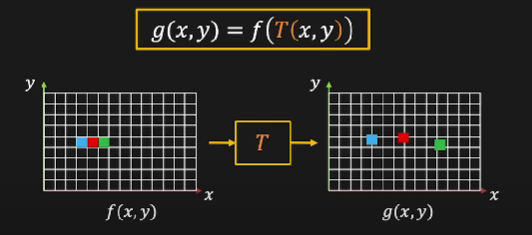

Por ende, OpenCV realiza la transformacion inversa a la indicada, calculando el mapeo de cada píxel $(x,y)$ de la imagen de destino sobre la imagen original. En el caso de que el mapeo de un píxel de la imagen de destino (usando la transformación inversa) no se corresponda exactamente con un píxel concreto de la imagen de origen (los mapeos devuelven numeros flotantes), simplemente procedemos asignándole la intensidad del píxel vecino más próximo, o usando un método de interpolación más sotisficado.

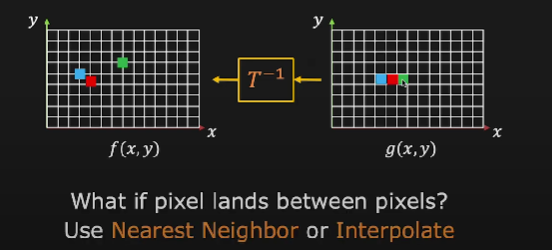

En cuanto a los píxeles de la imagen de destino que se mapeen a zonas situadas fuera de la imagen de origen, procedemos a aplicar el `borderMode` indicado, que simplemente los pone transparentes.

Además, es importante tener en cuenta cómo pegamos las imágenes sobre el lienzo, ya que esto puede suponer obtener un mosaico de mayor o menor calidad. En este caso, se recomienda comenzar pegando las imágenes situadas en los extremos, hasta el centro, y finalmente, pegar la imagen central, que solo requiere una traslación.

Por último, y no menos importante, recalcar que la imagen seleccionada como imagen central no tiene por qué ser justamente la imagen situada en el centro de la lista ordenada de imágenes. Si por ejemplo se tomasen muchas más fotos de un objeto 3D del lado izquierdo que del derecho, la distorsión será mayor sobre el lado del que hayamos sacado un menor nº de fotos, siendo recomendable en este caso tomar como imagen central una imagen del lado derecho del objeto.

In [152]:
# This function composes the mosaic. It receives:
# * images: the list of images
# * canvas: the canvas, generated through the application of setCanvas()
# * H: the list of homographies, obtained through the application of
# computeLocalHomographies() and mosaicHomographies()
# * idx: the index of the central image
# * H0: the homography that represents the translation from the central image to the
# canvas obtained through the application of axesHomography()
def composeMosaic(images,canvas,H,idx,H0, visualizar_proceso=False):
  #Comenzamos tomando el nº de filas y columnas del lienzo
  filas = canvas.shape[0]
  columnas = canvas.shape[1]
  '''
  Para obtener un mosaico de la mayor calidad posible, debemos comenzar pegando aquellas imágenes que hayan sufrido
  una mayor deformación (se le ha aplicado un mayor nº de homografías), y finalmente pegando aquellas menos deformadas (imagen central)
  Por ende, comenzamos pegando desde los extremos hasta el centro
  '''
  historial=[]
  for i in range(0,idx): #desde el extremo izquierdo hasta el centro, sin tomar la central
    canvas=cv2.warpPerspective(images[i], H0 @ H[i], (columnas,filas), dst=canvas, flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_TRANSPARENT)
    historial.append(canvas.copy())

  #Pegamos ahora desde el extremo derecho hasta el centro
  # Coloca las imágenes a la derecha de la imagen central, desde la última situada más a la derecha hasta la central
  #Cuidado porque el nº de homografías es 'nº de imagenes - 1'
  contador = len(H)-1
  for i in range(len(images)-1, idx, -1):
    canvas=cv2.warpPerspective(images[i], H0 @ H[contador], (columnas,filas), dst=canvas, flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_TRANSPARENT)
    historial.append(canvas.copy())
    contador -= 1

  #Coloco por último la imagen central sobre el canvas
  canvas = cv2.warpPerspective(images[idx], H0, (columnas,filas), dst=canvas, flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_TRANSPARENT)
  historial.append(canvas.copy())

  if(visualizar_proceso):
    total_pegadas = 0
    for i in historial:
      total_pegadas += 1
      displayIm(blackOut(i),title=f'Nº de imágenes pegadas : {total_pegadas}')

  return canvas

Ya hemos implementado todo el código necesario para construir una imagen panorámica a partir de una lista de imágenes. La imagen justamente inferior muestra, a modo de resumen, el proceso que hay que llevar a cabo :

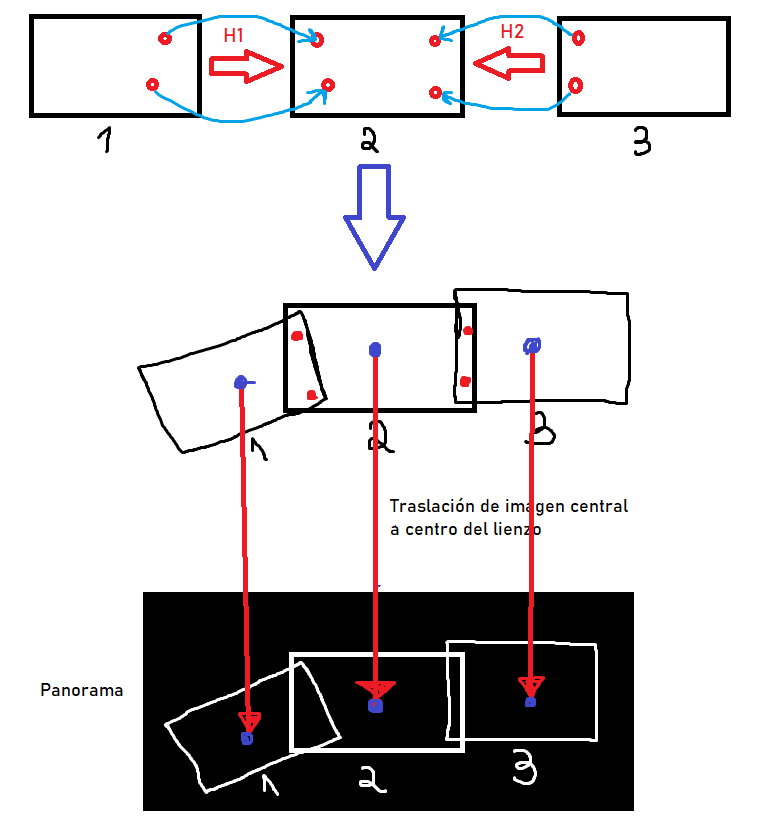

<font color='blue'>Se debe mostrar la composición, paso a paso, del canvas, es decir, el canvas a medida que se le van incorporando cada una de las imágenes, así como la composición final del mosaico. Finalmente, se debe comparar el resultado de nuestra composición manual con el _stitcher_ de OpenCV: `cv2.Stitcher`.

<font color='blue'>Al igual que en todas las demás entregas y ejercicios, resulta fundamental documentar el trabajo realizado, y explicar pausadamente todas las etapas implementadas (qué se ha hecho, cómo se ha hecho, y por qué se ha hecho así).

Procedemos a generar el panorama de la siguiente lista de imágenes, empleando como imagen central aquella situada justamente en el centro.

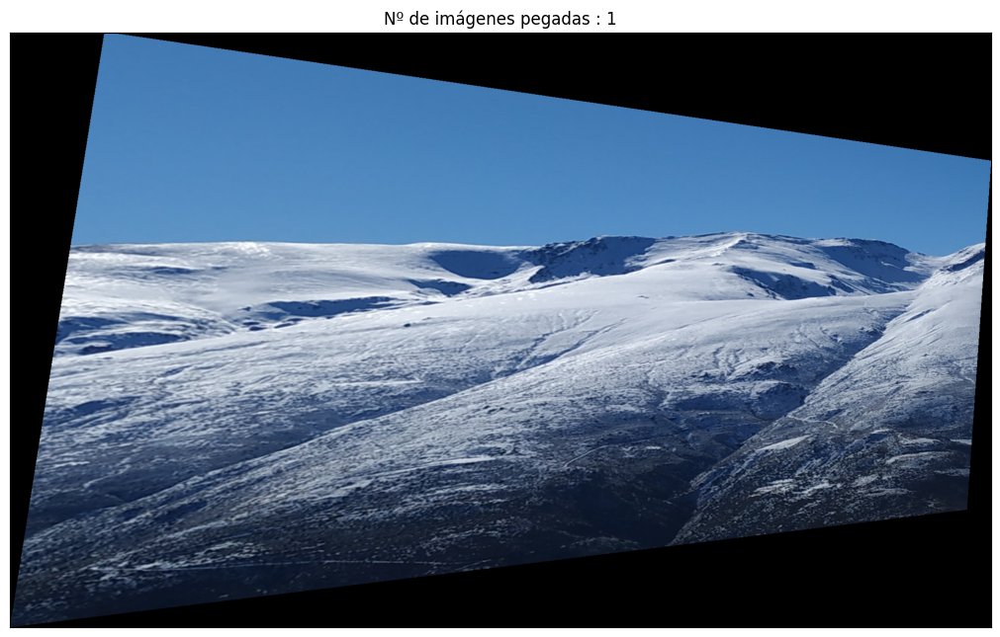

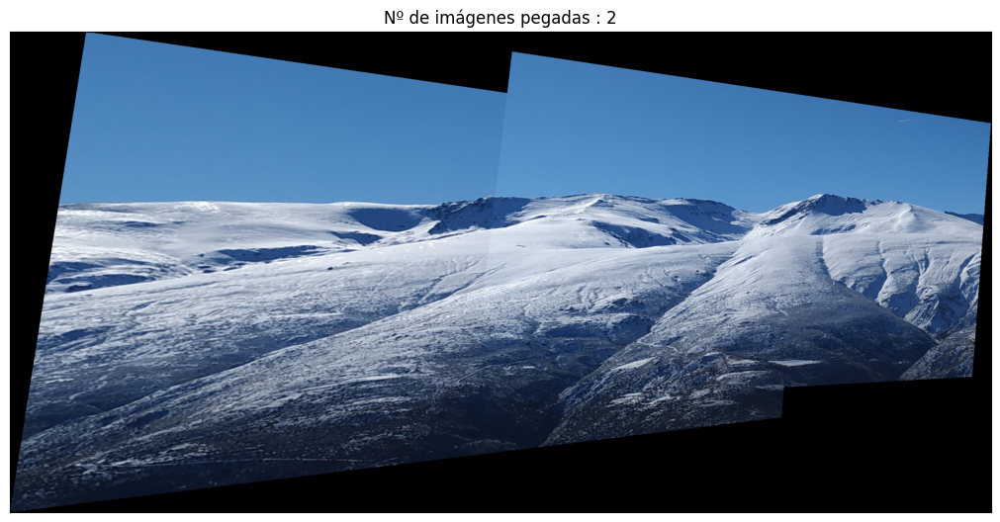

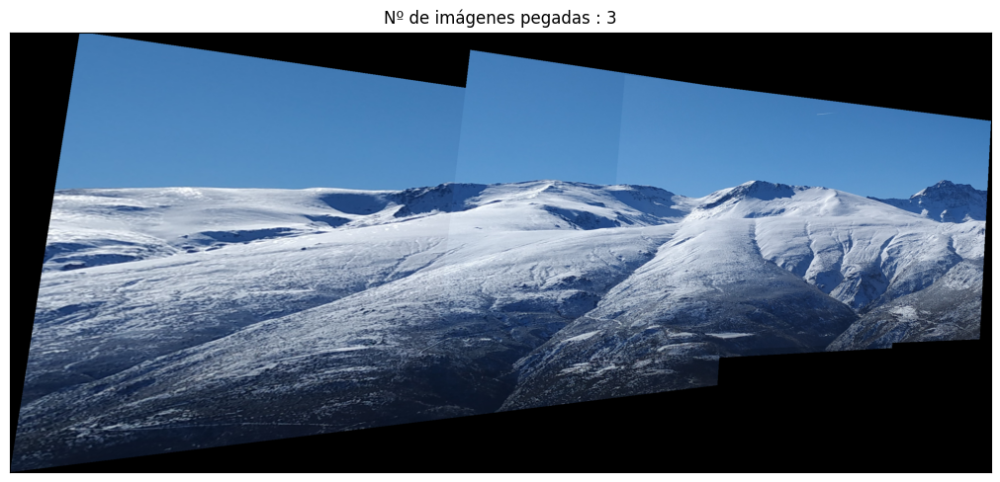

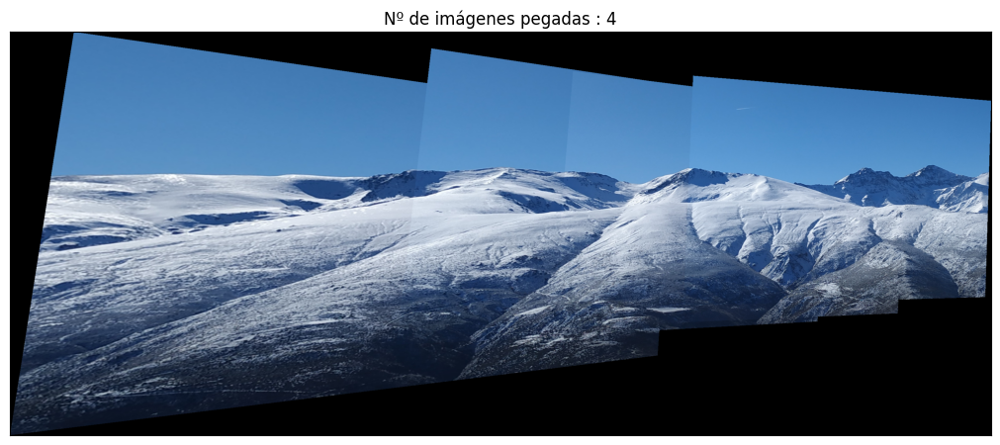

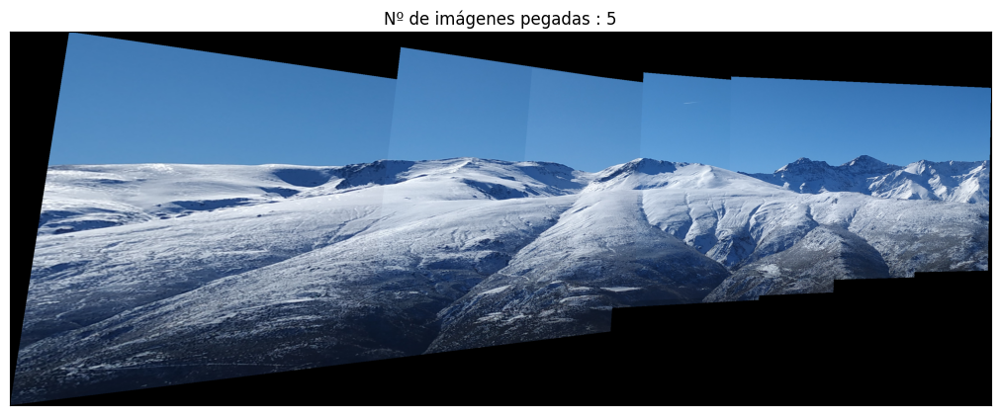

...

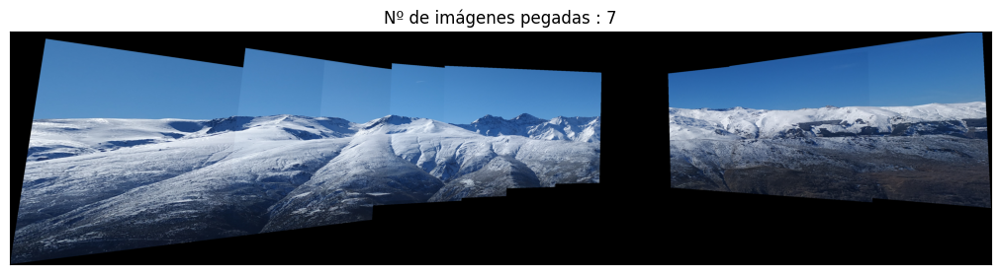

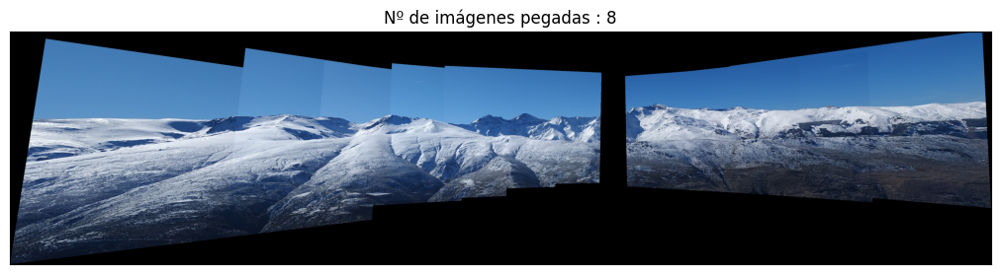

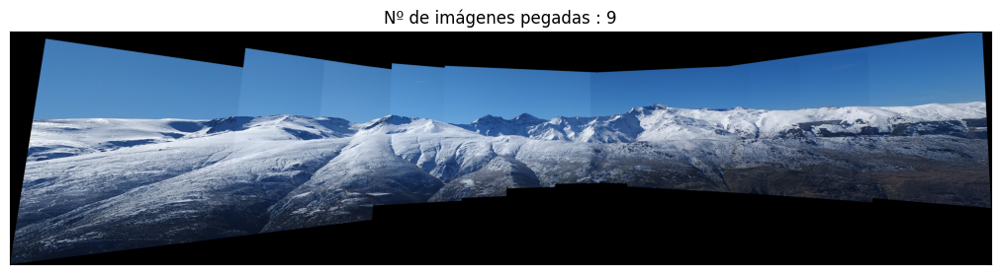

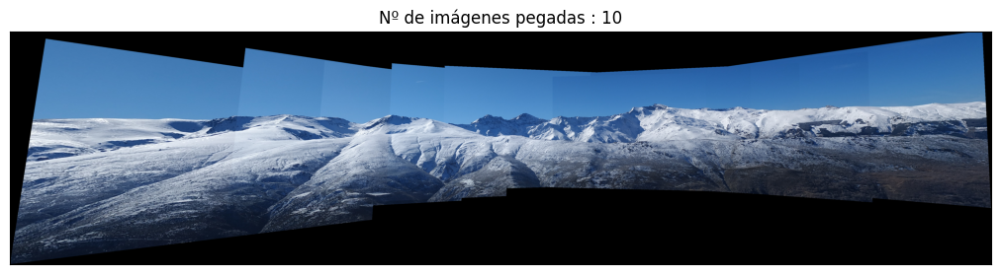

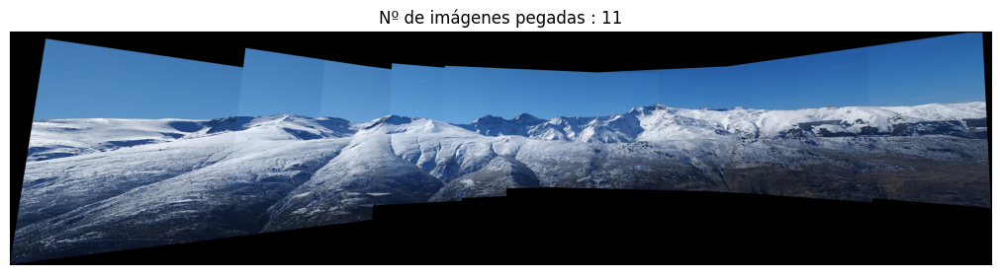

In [153]:
PREFIX='IMG_20220312_1029'
nameImages=['34_S.jpg','37_S.jpg','40_S.jpg','42_S.jpg','44_S.jpg','46_S.jpg','48_S.jpg','50_S.jpg','51_S.jpg','54_S.jpg','57_S.jpg']

#Lista que almacena las imágenes que forman parte del mosaico
images=[]
for item in nameImages:
   images.append(cv2.resize(readIm(get_image(PREFIX+item),flagColor=1), (0,0), fx=0.5, fy=0.5))
#índice de imagen seleccionada como imagen central
id_centro = 5

#Comenzamos calculando las homografías locales entre imágenes consecutivas
H=computeLocalHomographies(images)

#Calculamos ahora la homografía que proyecta cada imagen en la imagen central
H=mosaicHomographies(H,id_centro)

#Construimos el lienzo sobre el que colocaremos la imagen panorámica
dimensiones = [im.shape[:2] for im in images]
filas, columnas = np.amax(dimensiones,axis=0) #Utilizamos la imagen de mayores dimensiones
canvas = setCanvas(filas,columnas,flagColor=True,nim=len(images))

#Calculamos la homografía (en este caso, traslacion) que proyecta la imagen central en el centro del lienzo
filas, columnas = canvas.shape[:2] #puede tener 2 o 3 dimensiones, en función de si usamos imágenes a color o en escala de grises
H0=axesHomography(images[id_centro].shape[:2],(filas,columnas))

#Generamos la imagen panorámica
mosaico=composeMosaic(images,canvas,H,id_centro,H0,visualizar_proceso=True)

Calculemos ahora la imagen panorámica usando directamente el stitcher de OpenCV `cv2.Stitcher`.

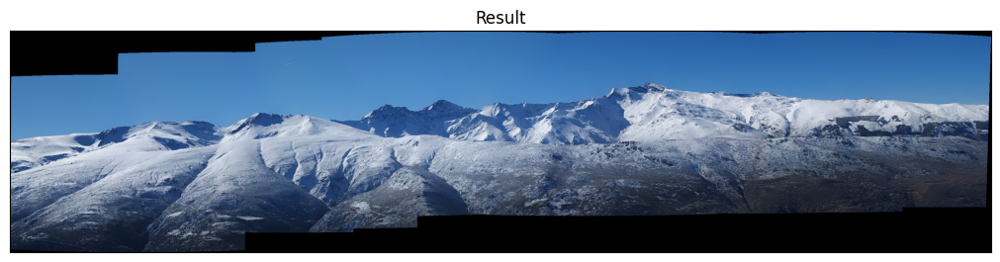

In [154]:
stitcher = cv2.Stitcher_create()
_, mosaico_automatico = stitcher.stitch(images)
displayIm(mosaico_automatico)

La principal diferencia que detecto, a simple vista, es que el método automático de OpenCV, a diferencia del manual que hemos implementado, realiza **blending** para difuminar las líneas que aparecen al pegar entre sí las imágenes. Sin embargo, no tenemos ningún control sobre las etapas que se llevan a cabo internamente, a diferencia del procedimiento manual implementado, en cuanto a la selección de la imagen central, detección de caracteristicas, homografías...